# Imports and Helper functions

In [1]:
import os
import json
import pickle
import itertools
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import DenseNet201, nasnet
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, average_precision_score
from sklearn.preprocessing import label_binarize, LabelEncoder

E0000 00:00:1741598464.559613      13 common_lib.cc:798] Could not set metric server port: INVALID_ARGUMENT: Could not find SliceBuilder port 8471 in any of the 0 ports provided in `tpu_process_addresses`="local"
=== Source Location Trace: ===
learning/45eac/tfrc/runtime/common_lib.cc:479
D0310 09:21:04.568009542      13 config.cc:196]                        gRPC EXPERIMENT call_status_override_on_cancellation   OFF (default:OFF)
D0310 09:21:04.568027077      13 config.cc:196]                        gRPC EXPERIMENT call_v3                                OFF (default:OFF)
D0310 09:21:04.568030705      13 config.cc:196]                        gRPC EXPERIMENT canary_client_privacy                  ON  (default:ON)
D0310 09:21:04.568033282      13 config.cc:196]                        gRPC EXPERIMENT capture_base_context                   ON  (default:ON)
D0310 09:21:04.568035811      13 config.cc:196]                        gRPC EXPERIMENT client_idleness                        ON  (defau

# Exploratory Data Analysis

In [2]:
# Load the dataset
file_path = '/kaggle/input/fashion-product-images-dataset/fashion-dataset/styles.csv'
eda_df = pd.read_csv(file_path, on_bad_lines='skip')
eda_df = eda_df[['id', 'gender', 'masterCategory', 'subCategory', 'articleType', 'baseColour', 'season', 'year', 'usage', 'productDisplayName']]

In [3]:
# Display basic information about the dataset
print("Dataset Information:")
print(eda_df.info())

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44424 entries, 0 to 44423
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   id                  44424 non-null  int64  
 1   gender              44424 non-null  object 
 2   masterCategory      44424 non-null  object 
 3   subCategory         44424 non-null  object 
 4   articleType         44424 non-null  object 
 5   baseColour          44409 non-null  object 
 6   season              44403 non-null  object 
 7   year                44423 non-null  float64
 8   usage               44107 non-null  object 
 9   productDisplayName  44417 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 3.4+ MB
None


In [4]:
print(eda_df.describe(include='all'))

                  id gender masterCategory subCategory articleType baseColour  \
count   44424.000000  44424          44424       44424       44424      44409   
unique           NaN      5              7          45         143         46   
top              NaN    Men        Apparel     Topwear     Tshirts      Black   
freq             NaN  22147          21397       15402        7067       9728   
mean    29696.334301    NaN            NaN         NaN         NaN        NaN   
std     17049.490518    NaN            NaN         NaN         NaN        NaN   
min      1163.000000    NaN            NaN         NaN         NaN        NaN   
25%     14768.750000    NaN            NaN         NaN         NaN        NaN   
50%     28618.500000    NaN            NaN         NaN         NaN        NaN   
75%     44683.250000    NaN            NaN         NaN         NaN        NaN   
max     60000.000000    NaN            NaN         NaN         NaN        NaN   

        season          yea

In [5]:
print("\nFirst few rows of the dataset:")
print(eda_df.head())


First few rows of the dataset:
      id gender masterCategory subCategory  articleType baseColour  season  \
0  15970    Men        Apparel     Topwear       Shirts  Navy Blue    Fall   
1  39386    Men        Apparel  Bottomwear        Jeans       Blue  Summer   
2  59263  Women    Accessories     Watches      Watches     Silver  Winter   
3  21379    Men        Apparel  Bottomwear  Track Pants      Black    Fall   
4  53759    Men        Apparel     Topwear      Tshirts       Grey  Summer   

     year   usage                             productDisplayName  
0  2011.0  Casual               Turtle Check Men Navy Blue Shirt  
1  2012.0  Casual             Peter England Men Party Blue Jeans  
2  2016.0  Casual                       Titan Women Silver Watch  
3  2011.0  Casual  Manchester United Men Solid Black Track Pants  
4  2012.0  Casual                          Puma Men Grey T-shirt  


In [6]:
# Number of unique values in each column
print("\nNumber of unique values in each column:")
print(eda_df.nunique())


Number of unique values in each column:
id                    44424
gender                    5
masterCategory            7
subCategory              45
articleType             143
baseColour               46
season                    4
year                     13
usage                     8
productDisplayName    31121
dtype: int64


In [7]:
# Count the occurrences of each articleType
article_counts = eda_df['articleType'].value_counts()

# Total number of classes before preprocessing
total_classes = len(article_counts)

print(f"Total number of classes in 'articleType' before preprocessing: {total_classes}")

Total number of classes in 'articleType' before preprocessing: 143


In [8]:
# Calculate the cumulative percentage
cumulative_percentage = 100 * article_counts.cumsum() / article_counts.sum()

# Find the number of classes that represent 95% of the data
classes_95_percent = (cumulative_percentage <= 95).sum()

print(f"Number of classes in 'articleType' representing 95% of the data: {classes_95_percent}")

Number of classes in 'articleType' representing 95% of the data: 54


In [9]:
def create_pie_and_bar_chart(data, title, filename, top_n=20):
    # Pie chart
    plt.figure(figsize=(12, 12))  
    top_categories = data.head(top_n)
    others = pd.Series({'Others': data.iloc[top_n:].sum()})
    pie_data = pd.concat([top_categories, others])
    
    colors = sns.color_palette("husl", len(pie_data))
    plt.pie(pie_data.values, labels=pie_data.index, autopct='%1.1f%%', startangle=90, colors=colors)
    plt.title(f'Top {top_n} Categories', fontsize=28)  
    plt.axis('equal')
    
    # Increase font size for pie chart labels and percentages
    plt.rcParams['font.size'] = 16  
    
    plt.savefig(f'{filename}_pie.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    # Bar chart
    plt.figure(figsize=(15, 15))  
    remaining_categories = data.iloc[top_n:classes_95_percent]
    remaining_categories = remaining_categories.sort_values(ascending=True)
    
    colors = sns.color_palette("YlOrBr", len(remaining_categories))
    bars = plt.barh(range(len(remaining_categories)), remaining_categories.values, color=colors)
    plt.yticks(range(len(remaining_categories)), remaining_categories.index, fontsize=16)  
    plt.xlabel('Count', fontsize=18)  
    plt.title(f'Remaining Categories up to 95% of Data', fontsize=26)  
    
    # Add value labels to the end of each bar
    for bar in bars:
        width = bar.get_width()
        plt.text(width, bar.get_y() + bar.get_height()/2, f'{width}', 
                 ha='left', va='center', fontsize=16)  
    
    plt.tight_layout()
    plt.savefig(f'{filename}_bar.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

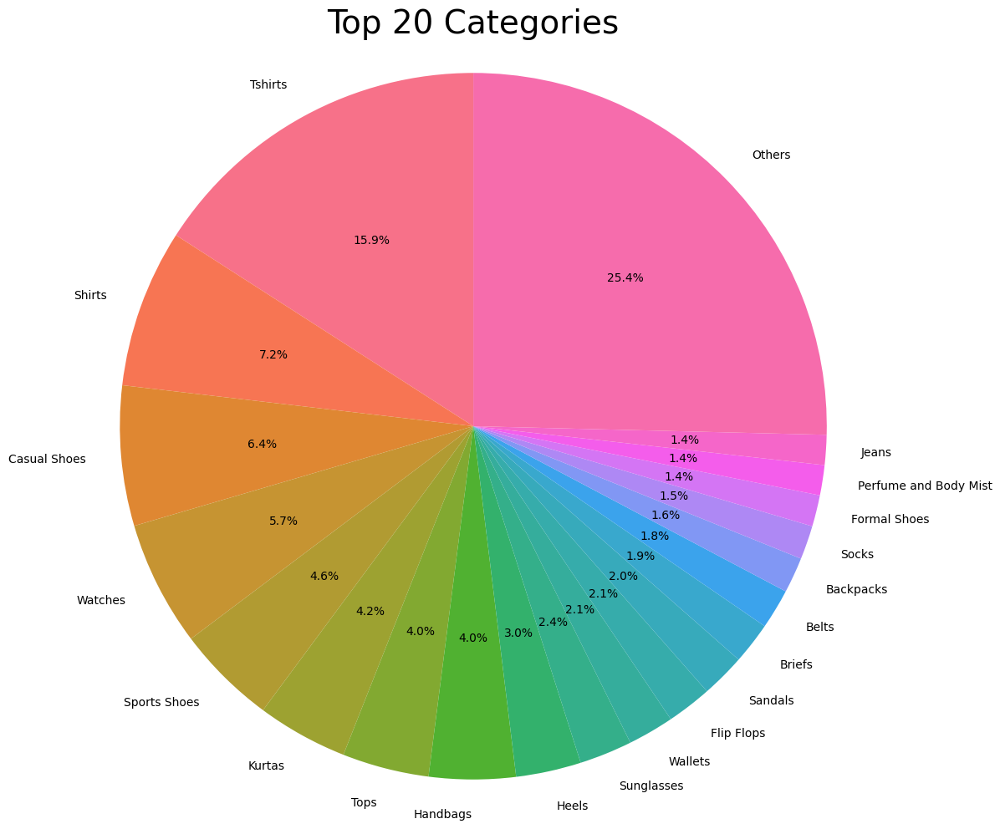

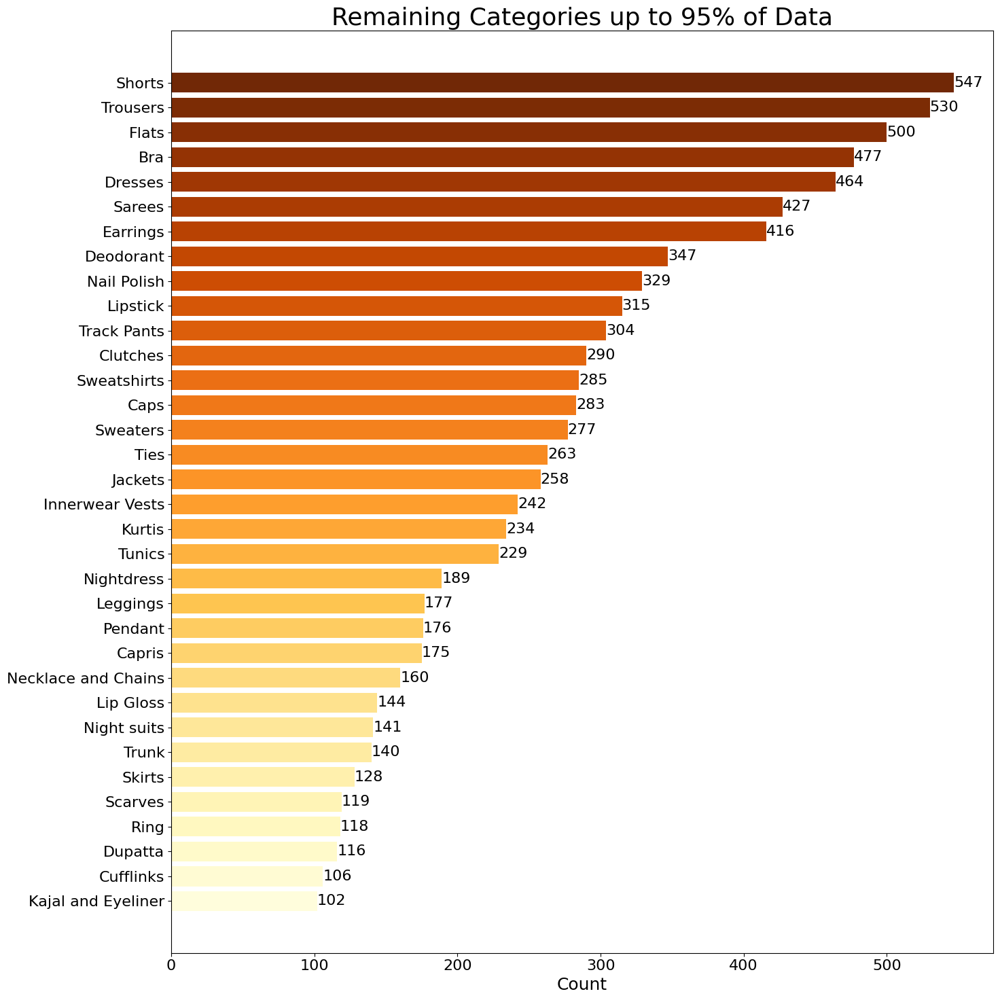

Charts have been saved as 'article_types_distribution_pie.png' and 'article_types_distribution_bar.png'

Classes representing 95% of the data:
1. Tshirts: 7067
2. Shirts: 3217
3. Casual Shoes: 2845
4. Watches: 2542
5. Sports Shoes: 2036
6. Kurtas: 1844
7. Tops: 1762
8. Handbags: 1759
9. Heels: 1323
10. Sunglasses: 1073
11. Wallets: 936
12. Flip Flops: 914
13. Sandals: 897
14. Briefs: 849
15. Belts: 813
16. Backpacks: 724
17. Socks: 686
18. Formal Shoes: 637
19. Perfume and Body Mist: 613
20. Jeans: 609
21. Shorts: 547
22. Trousers: 530
23. Flats: 500
24. Bra: 477
25. Dresses: 464
26. Sarees: 427
27. Earrings: 416
28. Deodorant: 347
29. Nail Polish: 329
30. Lipstick: 315
31. Track Pants: 304
32. Clutches: 290
33. Sweatshirts: 285
34. Caps: 283
35. Sweaters: 277
36. Ties: 263
37. Jackets: 258
38. Innerwear Vests: 242
39. Kurtis: 234
40. Tunics: 229
41. Nightdress: 189
42. Leggings: 177
43. Pendant: 176
44. Capris: 175
45. Necklace and Chains: 160
46. Lip Gloss: 144
47. Night suits: 141
4

In [10]:
# Create charts for all classes up to 95%
create_pie_and_bar_chart(article_counts, 'Distribution of Article Types (95% of Data)', 'article_types_distribution')

print(f"Charts have been saved as 'article_types_distribution_pie.png' and 'article_types_distribution_bar.png'")

# Optional: Print the classes representing 95% of the data
classes = article_counts.index[:classes_95_percent].tolist()
print("\nClasses representing 95% of the data:")
for i, class_name in enumerate(classes, 1):
    print(f"{i}. {class_name}: {article_counts[class_name]}")

# Load and Preprocess Data

In [11]:
# Disable warnings
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"

# Set the style for the plots
sns.set_palette("pastel")

def load_and_preprocess_data(data_dir, valid_samples=100):
    """Loads the dataset, preprocesses it, and splits it into train, validation, and test sets."""
    images_folder = os.path.join(data_dir, "images")
    styles_path = os.path.join(data_dir, "styles.csv")

    df = pd.read_csv(styles_path, on_bad_lines="skip")
    df = df[df["id"].apply(lambda x: os.path.isfile(os.path.join(images_folder, str(x) + ".jpg")))]
    df["image"] = df["id"].apply(lambda x: os.path.join(images_folder, str(x) + ".jpg"))
    df = df[["image", "articleType"]]

    # Filter categories with at least valid_samples samples
    valid_categories = df["articleType"].value_counts()[df["articleType"].value_counts() >= valid_samples].index
    df = df[df["articleType"].isin(valid_categories)]

    # Split data into train, validation, and test sets
    train_df, temp_df = train_test_split(df, test_size=0.2, stratify=df["articleType"], random_state=42)
    val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df["articleType"], random_state=42)
    
    # Calculate total number of images
    total_images = len(df)

    # Print the number of samples in each set
    print(f"Total number of images after filtering: {total_images}")
    print(f"Number of samples in train set: {len(train_df)}")
    print(f"Number of samples in validation set: {len(val_df)}")
    print(f"Number of samples in test set: {len(test_df)}")
    
    return train_df, val_df, test_df, total_images

In [12]:
def resize_with_padding(image, target_height, target_width):
    """Resizes the image to the target size with padding."""
    height, width = tf.shape(image)[0], tf.shape(image)[1]

    if tf.equal(height, 0) or tf.equal(width, 0):
        return tf.zeros([target_height, target_width, 3], dtype=tf.float32)

    scale = tf.minimum(
        tf.cast(target_width, tf.float32) / tf.cast(width, tf.float32),
        tf.cast(target_height, tf.float32) / tf.cast(height, tf.float32),
    )
    new_height = tf.cast(tf.cast(height, tf.float32) * scale, tf.int32)
    new_width = tf.cast(tf.cast(width, tf.float32) * scale, tf.int32)
    resized_image = tf.image.resize(image, [new_height, new_width])
    padded_image = tf.image.pad_to_bounding_box(
        resized_image,
        (target_height - new_height) // 2,
        (target_width - new_width) // 2,
        target_height,
        target_width,
    )
    return padded_image

In [13]:
def preprocess_image(image_path, target_size, preprocess_input_func):
    """Loads, resizes, and preprocesses a single image."""
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = resize_with_padding(image, target_size[0], target_size[1])
    image = preprocess_input_func(image)
    return image

In [14]:
def create_dataset(df, batch_size, target_size, preprocess_input_func, is_training=False):
    """Creates a TensorFlow dataset from the dataframe."""
    image_paths = df["image"].values
    labels = pd.get_dummies(df["articleType"]).values
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))

    if is_training:
        dataset = dataset.shuffle(buffer_size=len(df))

    dataset = dataset.map(
        lambda image_path, label: (preprocess_image(image_path, target_size, preprocess_input_func), label),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

In [15]:
def build_model(model_name, input_shape, num_classes):
    """Builds and compiles the CNN model."""           
    if model_name == "ResNet50":
        base_model = tf.keras.applications.ResNet50(weights="imagenet", include_top=False, input_shape=input_shape)
    elif model_name == "Xception":
        base_model = tf.keras.applications.Xception(weights="imagenet", include_top=False, input_shape=input_shape)
    elif model_name == "EfficientNetV2M":
        base_model = tf.keras.applications.EfficientNetV2M(weights="imagenet", include_top=False, input_shape=input_shape)
    elif model_name == "InceptionV3":
        base_model = tf.keras.applications.InceptionV3(weights="imagenet", include_top=False, input_shape=input_shape)
    elif model_name == "NASNetLarge":
        base_model = tf.keras.applications.NASNetLarge(weights="imagenet", include_top=False, input_shape=input_shape)
    elif model_name == "DenseNet201":
        base_model = tf.keras.applications.DenseNet201(weights="imagenet", include_top=False, input_shape=input_shape)
    else:
        raise ValueError(f"Unsupported model: {model_name}")

    # Make the last 20 layers trainable
    for layer in base_model.layers[-20:]:
        layer.trainable = True

    model = tf.keras.Sequential([
        base_model,
        tf.keras.layers.GlobalAveragePooling2D(),
        tf.keras.layers.Dense(2048, activation="relu"),
        tf.keras.layers.Dropout(0.3),
        tf.keras.layers.Dense(num_classes, activation="softmax"),
    ])

    model.compile(loss="categorical_crossentropy",
                  optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
                  metrics=["accuracy"])
    return model

In [16]:
def train_model(model, model_name, train_dataset, val_dataset, epochs=30):
    """Trains the model and returns the training history."""
    model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
        f"best_model_{model_name}.keras",
        save_best_only=True,
        monitor="val_accuracy",
        mode="max",
        verbose=1
    )
    callbacks = [
        tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.4, patience=3, min_lr=1e-6),
        model_checkpoint
    ]

    history = model.fit(train_dataset, epochs=epochs, validation_data=val_dataset, verbose=1, callbacks=callbacks)
    return history

In [17]:
def plot_confusion_matrix(cm, classes, title='Confusion Matrix'):
    plt.figure(figsize=(30, 25))
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()
    plt.tight_layout()

In [18]:
def plot_macro_average_prc_curve(true_labels, predicted_probs, class_labels, model_name):
    plt.figure(figsize=(10, 8))
    
    # Binarize the labels
    true_labels_bin = label_binarize(true_labels, classes=range(len(class_labels)))
    
    # Compute Precision-Recall curve and average precision for each class
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(len(class_labels)):
        precision[i], recall[i], _ = precision_recall_curve(true_labels_bin[:, i], predicted_probs[:, i])
        average_precision[i] = average_precision_score(true_labels_bin[:, i], predicted_probs[:, i])
    
    # Compute macro-average precision-recall curve
    precision["macro"], recall["macro"], _ = precision_recall_curve(true_labels_bin.ravel(), predicted_probs.ravel())
    average_precision["macro"] = average_precision_score(true_labels_bin, predicted_probs, average="macro")
    
    # Plot macro-average precision-recall curve
    plt.plot(recall["macro"], precision["macro"], 
             label=f'Macro-average PRC (AP = {average_precision["macro"]:.2f})',
             color='navy', linestyle='-', linewidth=2)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Macro-Average Precision-Recall Curve for {model_name}')
    plt.legend(loc="lower left")
    plt.savefig(f'macro_avg_prc_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

    return average_precision["macro"]

# Model Configuration

In [19]:
# Configuration
data_dir = "/kaggle/input/fashion-product-images-dataset/fashion-dataset"
batch_size = 128
epochs = 30
models = ["EfficientNetV2M", "NASNetLarge", "ResNet50", "Xception", "InceptionV3", "DenseNet201"]

model_configs = {
    "EfficientNetV2M": {"target_size": (299, 299), "preprocess_input": tf.keras.applications.efficientnet_v2.preprocess_input},
    "NASNetLarge": {"target_size": (331, 331), "preprocess_input": tf.keras.applications.nasnet.preprocess_input},
    "ResNet50": {"target_size": (224, 224), "preprocess_input": tf.keras.applications.resnet50.preprocess_input},
    "Xception": {"target_size": (299, 299), "preprocess_input": tf.keras.applications.xception.preprocess_input},
    "InceptionV3": {"target_size": (299, 299), "preprocess_input": tf.keras.applications.inception_v3.preprocess_input},
    "DenseNet201": {"target_size": (224, 224), "preprocess_input": tf.keras.applications.densenet.preprocess_input},
}

# Load and preprocess data
train_df, val_df, test_df, total_images = load_and_preprocess_data(data_dir)

Total number of images after filtering: 42150
Number of samples in train set: 33720
Number of samples in validation set: 4215
Number of samples in test set: 4215


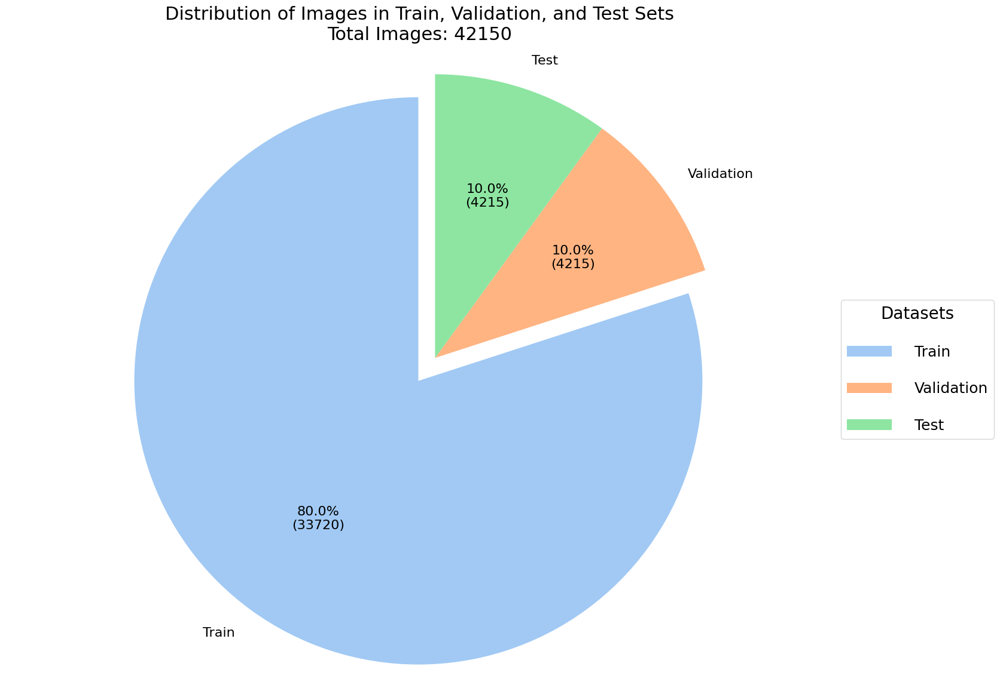

Pie chart has been saved as 'data_split_distribution.png'


In [20]:
# Create a pie chart
plt.figure(figsize=(20, 12))  # Increased figure size
sizes = [len(train_df), len(val_df), len(test_df)]
labels = ['Train', 'Validation', 'Test']
colors = sns.color_palette("pastel")[0:3]

plt.pie(sizes, labels=labels, colors=colors, autopct=lambda pct: f'{pct:.1f}%\n({int(pct/100.*sum(sizes))})', 
        startangle=90, textprops={'fontsize': 16}, explode=(0.1, 0, 0))
plt.title(f'Distribution of Images in Train, Validation, and Test Sets\nTotal Images: {total_images}', fontsize=22)
plt.axis('equal')

# Add a much larger legend
plt.legend(title="Datasets", loc="center left", bbox_to_anchor=(1, 0.5), fontsize=18, title_fontsize=20, 
           labelspacing=1.5, handlelength=3, handletextpad=1.5)

# Adjust layout to make room for the legend
plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust the right margin to accommodate the legend

# Save the pie chart
plt.savefig('data_split_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
plt.close()

print("Pie chart has been saved as 'data_split_distribution.png'")


Displaying resized images for EfficientNetV2M:


I0000 00:00:1741598623.282403      13 service.cc:145] XLA service 0x5ce7650778e0 initialized for platform TPU (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741598623.282466      13 service.cc:153]   StreamExecutor device (0): TPU, 2a886c8
I0000 00:00:1741598623.282471      13 service.cc:153]   StreamExecutor device (1): TPU, 2a886c8
I0000 00:00:1741598623.282475      13 service.cc:153]   StreamExecutor device (2): TPU, 2a886c8
I0000 00:00:1741598623.282478      13 service.cc:153]   StreamExecutor device (3): TPU, 2a886c8
I0000 00:00:1741598623.282480      13 service.cc:153]   StreamExecutor device (4): TPU, 2a886c8
I0000 00:00:1741598623.282483      13 service.cc:153]   StreamExecutor device (5): TPU, 2a886c8
I0000 00:00:1741598623.282486      13 service.cc:153]   StreamExecutor device (6): TPU, 2a886c8
I0000 00:00:1741598623.282488      13 service.cc:153]   StreamExecutor device (7): TPU, 2a886c8


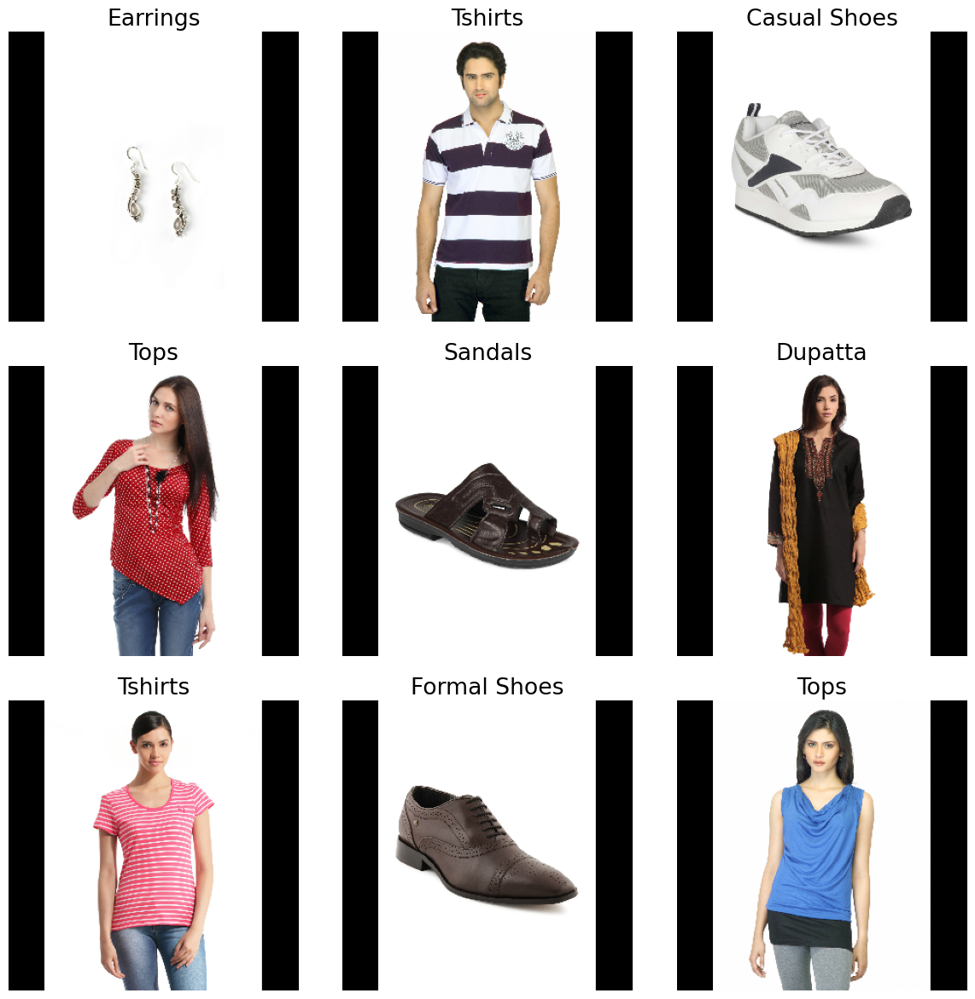


Displaying resized images for NASNetLarge:


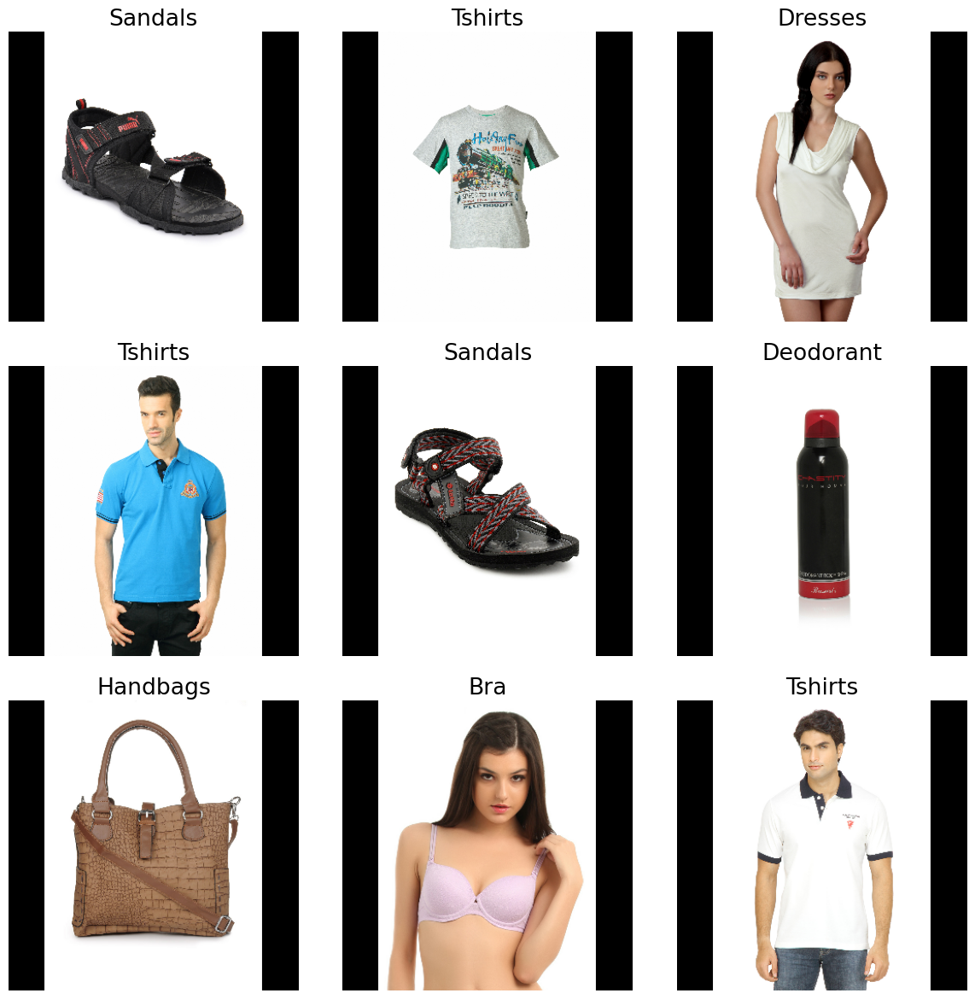


Displaying resized images for ResNet50:


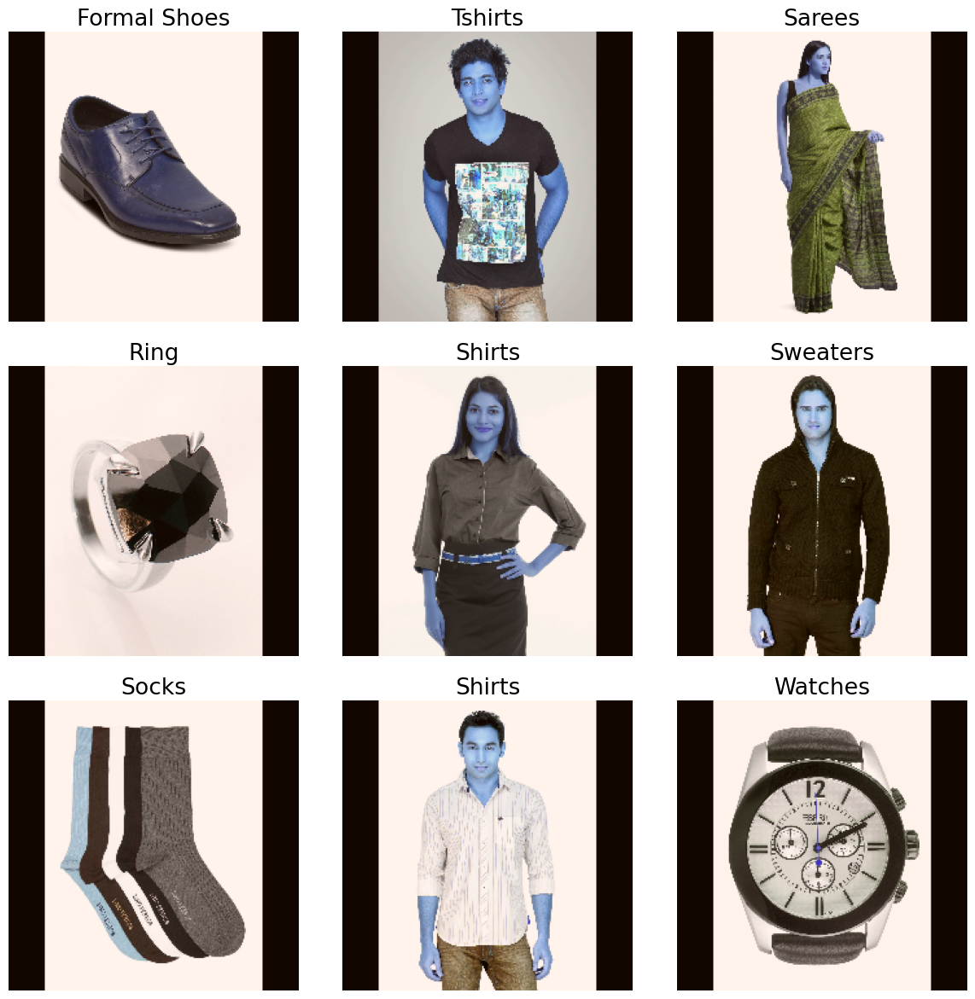


Displaying resized images for Xception:


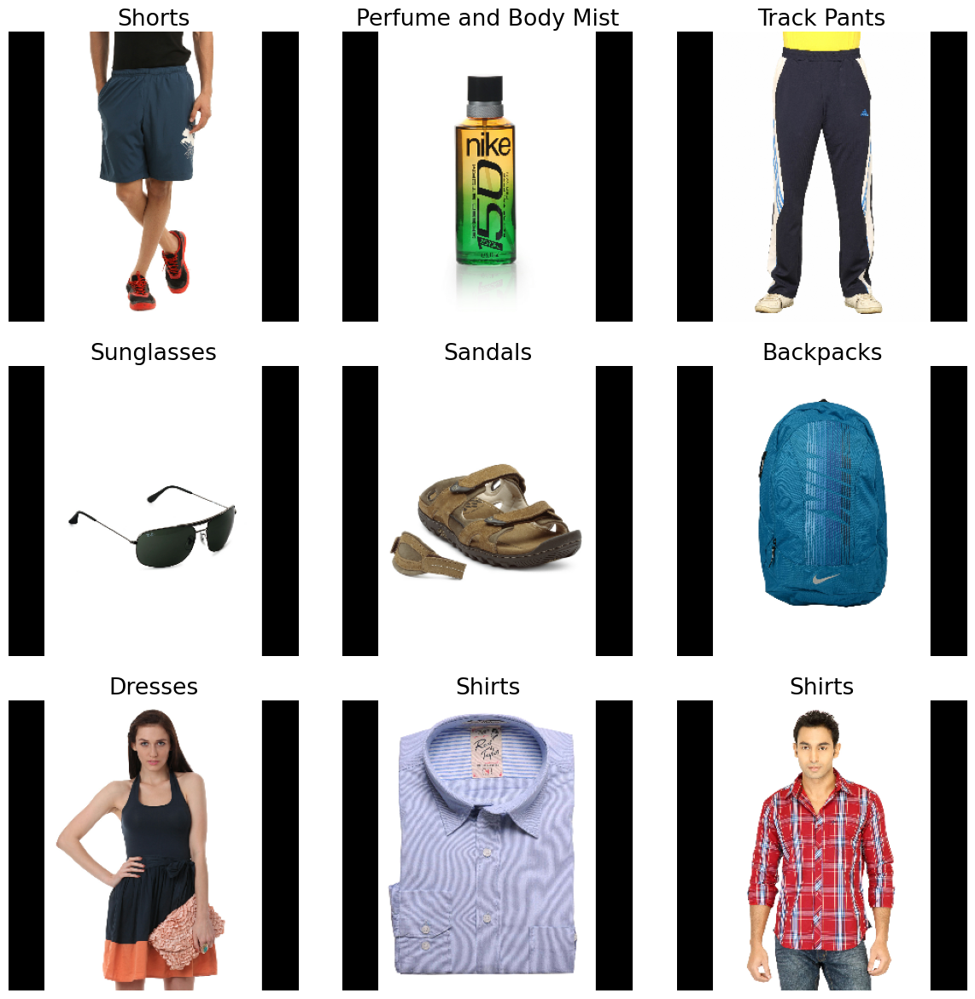


Displaying resized images for InceptionV3:


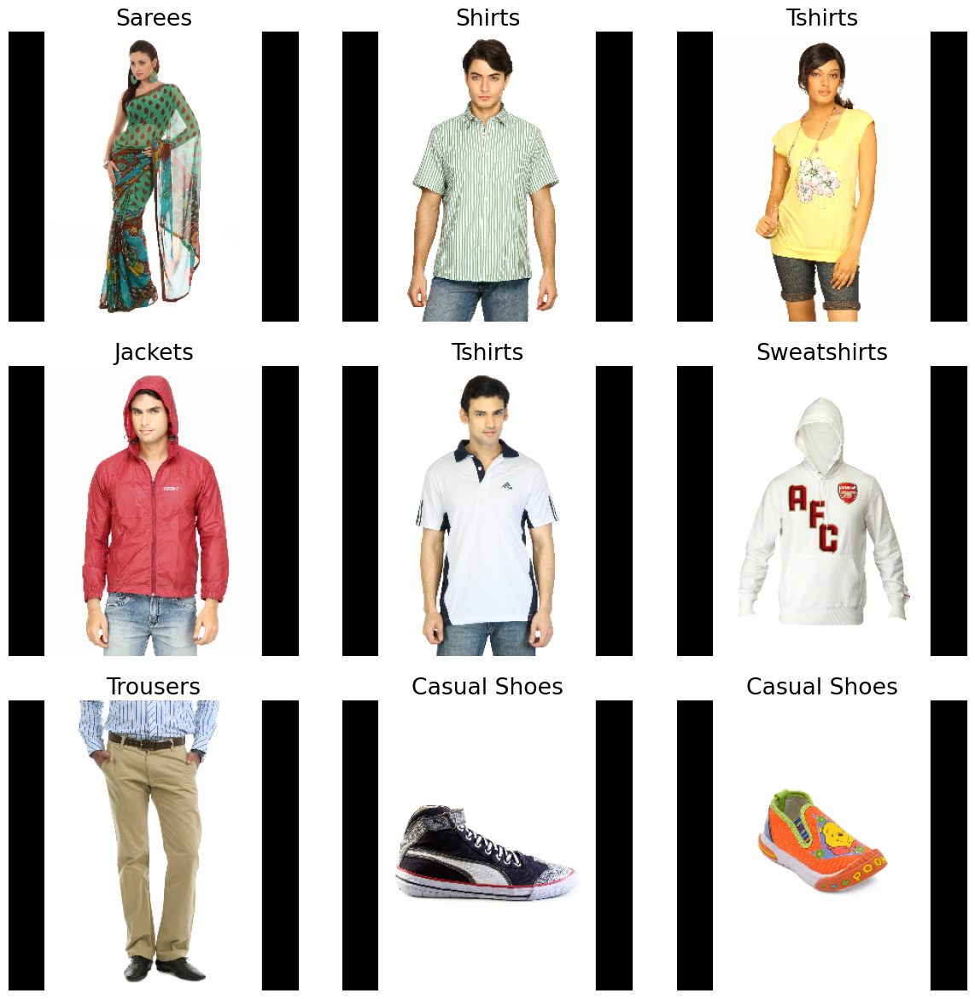


Displaying resized images for DenseNet201:


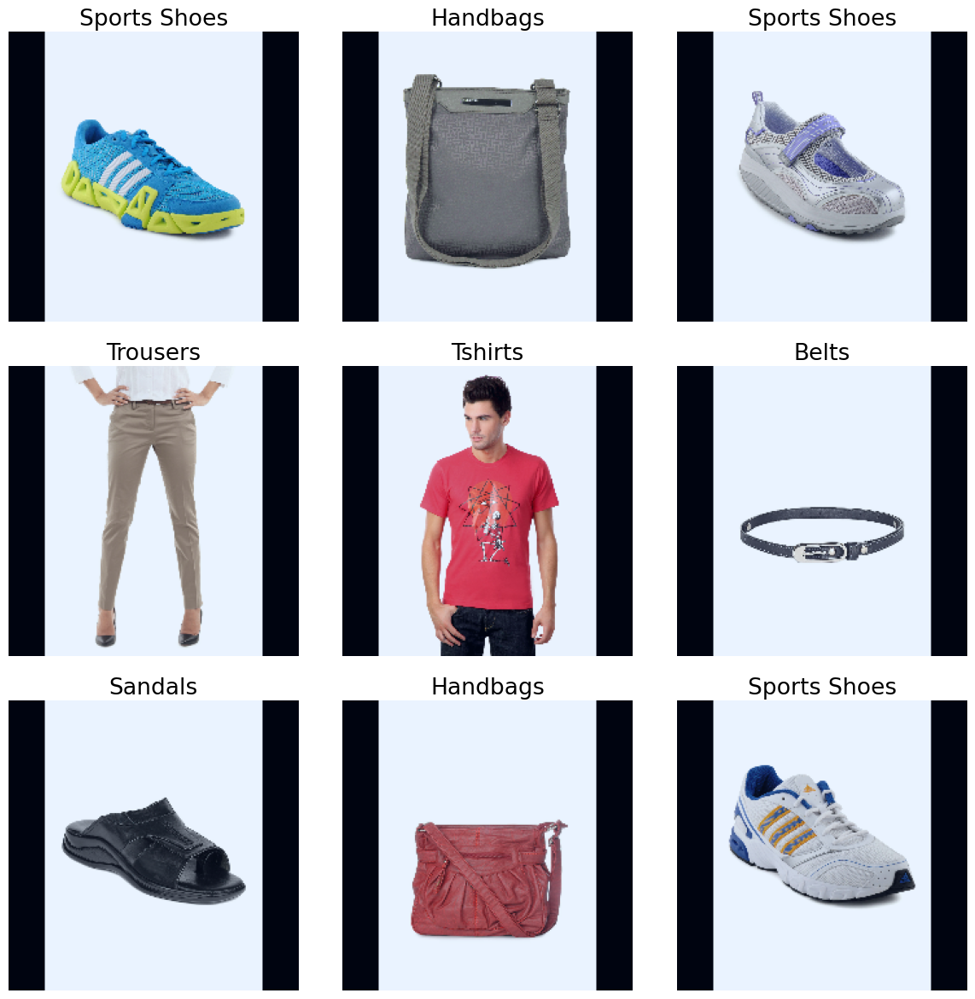

In [21]:
# Save test dataset
test_df.to_csv('test_dataset.csv', index=False)

# Save model configurations
with open('model_configs.json', 'w') as f:
    json.dump({k: {**v, "preprocess_input": v["preprocess_input"].__name__} for k, v in model_configs.items()}, f)

# Save class labels
class_labels = np.unique(train_df["articleType"])
np.save('class_labels.npy', class_labels)

# Get a random sample of 9 images
for model_name, config in model_configs.items():
    print(f"\nDisplaying resized images for {model_name}:")

    # Get a random sample of 9 images
    sample_df = train_df.sample(n=9)

    fig, axes = plt.subplots(3, 3, figsize=(12, 12))
    for i, (_, row) in enumerate(sample_df.iterrows()):
        img = preprocess_image(row['image'], config['target_size'], config['preprocess_input'])
        img = img.numpy()

        # Denormalize the image for display
        img = (img - np.min(img)) / (np.max(img) - np.min(img))

        ax = axes[i // 3, i % 3]
        ax.imshow(img)
        ax.set_title(row['articleType'])
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Model Training

In [22]:
# Detect and connect to a TPU if available
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print("Running on TPU ", tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
except ValueError:
    print("TPU is not available, using default strategy")
    strategy = tf.distribute.get_strategy()

# Train and evaluate models
histories = {}
for model_name in models:
    print(f"Training {model_name} model...")

    config = model_configs[model_name]
    train_dataset = create_dataset(
        train_df,
        batch_size,
        config["target_size"],
        config["preprocess_input"],
        is_training=True,
    )
    val_dataset = create_dataset(
        val_df, batch_size, config["target_size"], config["preprocess_input"]
    )

    with strategy.scope():
        model = build_model(model_name, (*config["target_size"], 3), len(class_labels))
        history = train_model(model, model_name, train_dataset, val_dataset, epochs)
        histories[model_name] = history

    # Save training history
    with open(f'history_{model_name}.pkl', 'wb') as f:
        pickle.dump(history.history, f)

Running on TPU  
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.
INFO:tensorflow:Found TPU system:
INFO:tensorflow:*** Num TPU Cores: 8
INFO:tensorflow:*** Num TPU Workers: 1
INFO:tensorflow:*** Num TPU Cores Per Worker: 8
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)
INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/

I0000 00:00:1741598654.650710      13 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch 1/30


2025-03-10 09:28:25.559533: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741598913.829661     842 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(f31a5769e1ecc9af:0:0), session_name()
I0000 00:00:1741598993.367043     842 tpu_compile_op_common.cc:245] Compilation of f31a5769e1ecc9af:0:0 with session name  took 1m19.53732758s and succeeded
I0000 00:00:1741598993.677541     842 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(f31a5769e1ecc9af:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_16717650325976434348", property.function_library_fingerprint = 5126729842329044317, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 354ms/step - accuracy: 0.4742 - loss: 2.3332

I0000 00:00:1741599087.116235     759 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(746347db5c630896:0:0), session_name()
I0000 00:00:1741599166.312228     759 tpu_compile_op_common.cc:245] Compilation of 746347db5c630896:0:0 with session name  took 1m19.195946157s and succeeded
I0000 00:00:1741599166.633803     759 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(746347db5c630896:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_16717650325976434348", property.function_library_fingerprint = 5126729842329044317, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,299,299,3,;7,54,;", property.guaranteed_constants_size = 0, e

264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - accuracy: 0.4748 - loss: 2.3302

2025-03-10 09:32:55.242322: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.
I0000 00:00:1741599177.168122     757 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(3097a678c5f42502:0:0), session_name()
I0000 00:00:1741599187.907685     757 tpu_compile_op_common.cc:245] Compilation of 3097a678c5f42502:0:0 with session name  took 10.73950886s and succeeded
I0000 00:00:1741599187.945340     757 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(3097a678c5f42502:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_69236310623942220", property.function_library_fingerprint = 2082603923618553674, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topolo


Epoch 1: val_accuracy improved from -inf to 0.82353, saving model to best_model_EfficientNetV2M.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 555s 820ms/step - accuracy: 0.4754 - loss: 2.3272 - val_accuracy: 0.8235 - val_loss: 0.6390 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 357ms/step - accuracy: 0.8007 - loss: 0.6803
Epoch 2: val_accuracy improved from 0.82353 to 0.86528, saving model to best_model_EfficientNetV2M.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 107s 403ms/step - accuracy: 0.8008 - loss: 0.6800 - val_accuracy: 0.8653 - val_loss: 0.4006 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 355ms/step - accuracy: 0.8547 - loss: 0.4668
Epoch 3: val_accuracy improved from 0.86528 to 0.88615, saving model to best_model_EfficientNetV2M.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 107s 402ms/step - accuracy: 0.8547 - loss: 0.4668 - val_accuracy: 0.8861 - val_loss: 0.3276 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 359ms/step - accuracy

2025-03-10 10:08:18.498252: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741601310.819392     823 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(c5f0b97a129c531d:0:0), session_name()
I0000 00:00:1741601463.864309     823 tpu_compile_op_common.cc:245] Compilation of c5f0b97a129c531d:0:0 with session name  took 2m33.04425265s and succeeded
I0000 00:00:1741601464.376097     823 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(c5f0b97a129c531d:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_2015277575652526099", property.function_library_fingerprint = 4277846087358331602, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z 

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 756ms/step - accuracy: 0.6160 - loss: 1.5406

I0000 00:00:1741601663.982535     778 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(7c2127ea5cdeb7b8:0:0), session_name()
I0000 00:00:1741601817.808760     778 tpu_compile_op_common.cc:245] Compilation of 7c2127ea5cdeb7b8:0:0 with session name  took 2m33.826147403s and succeeded
I0000 00:00:1741601818.220890     778 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(7c2127ea5cdeb7b8:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_2015277575652526099", property.function_library_fingerprint = 4277846087358331602, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,331,331,3,;7,54,;", property.guaranteed_constants_size = 0, em

264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.6165 - loss: 1.5385   

2025-03-10 10:17:07.561674: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.
I0000 00:00:1741601830.055284     771 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(ffafa7a836aabe4d:0:0), session_name()
I0000 00:00:1741601863.124385     771 tpu_compile_op_common.cc:245] Compilation of ffafa7a836aabe4d:0:0 with session name  took 33.0690365s and succeeded
I0000 00:00:1741601863.205931     771 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(ffafa7a836aabe4d:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_4660393305571133879", property.function_library_fingerprint = 3170098478788586118, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topol


Epoch 1: val_accuracy improved from -inf to 0.81025, saving model to best_model_NASNetLarge.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 1008s 2s/step - accuracy: 0.6169 - loss: 1.5364 - val_accuracy: 0.8102 - val_loss: 0.6737 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 762ms/step - accuracy: 0.8271 - loss: 0.5796
Epoch 2: val_accuracy improved from 0.81025 to 0.88046, saving model to best_model_NASNetLarge.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 222s 836ms/step - accuracy: 0.8272 - loss: 0.5794 - val_accuracy: 0.8805 - val_loss: 0.3623 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 761ms/step - accuracy: 0.8537 - loss: 0.4547
Epoch 3: val_accuracy improved from 0.88046 to 0.88805, saving model to best_model_NASNetLarge.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 220s 830ms/step - accuracy: 0.8538 - loss: 0.4546 - val_accuracy: 0.8880 - val_loss: 0.4004 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 756ms/step - accuracy: 0.8739 - los

2025-03-10 11:56:05.530395: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741607767.874082     798 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(bd65df5727a6c742:0:0), session_name()


  1/264 ━━━━━━━━━━━━━━━━━━━━ 7:53:21 108s/step - accuracy: 0.0625 - loss: 4.3050

I0000 00:00:1741607786.772923     798 tpu_compile_op_common.cc:245] Compilation of bd65df5727a6c742:0:0 with session name  took 18.898748415s and succeeded
I0000 00:00:1741607786.838941     798 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(bd65df5727a6c742:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_7205146007512740179", property.function_library_fingerprint = 9060445577113465740, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "16,224,224,3,;16,54,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1741607786.839000     798 tpu_compilation_cache_interface.cc:541] After adding entry for ke

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.5736 - loss: 1.7620

I0000 00:00:1741607821.939051     768 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(68be98d2384c0e19:0:0), session_name()


264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.5740 - loss: 1.7599

I0000 00:00:1741607841.083978     768 tpu_compile_op_common.cc:245] Compilation of 68be98d2384c0e19:0:0 with session name  took 19.144873356s and succeeded
I0000 00:00:1741607841.147265     768 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(68be98d2384c0e19:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_7205146007512740179", property.function_library_fingerprint = 9060445577113465740, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,224,224,3,;7,54,;", property.guaranteed_constants_size = 0, embedding_partitions_fingerprint = "1688352644216761960")
I0000 00:00:1741607841.147314     768 tpu_compilation_cache_interface.cc:541] After adding entry for key 


Epoch 1: val_accuracy improved from -inf to 0.82353, saving model to best_model_ResNet50.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 181s 277ms/step - accuracy: 0.5745 - loss: 1.7578 - val_accuracy: 0.8235 - val_loss: 0.6999 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.7918 - loss: 0.6777
Epoch 2: val_accuracy improved from 0.82353 to 0.85009, saving model to best_model_ResNet50.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - accuracy: 0.7918 - loss: 0.6775 - val_accuracy: 0.8501 - val_loss: 0.5261 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step - accuracy: 0.8366 - loss: 0.5473
Epoch 3: val_accuracy did not improve from 0.85009
264/264 ━━━━━━━━━━━━━━━━━━━━ 39s 146ms/step - accuracy: 0.8366 - loss: 0.5472 - val_accuracy: 0.8482 - val_loss: 0.5418 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step - accuracy: 0.8688 - loss: 0.4211
Epoch 4: val_accuracy improved from 0.85009 to

2025-03-10 12:16:56.181118: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741609018.032830     797 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(a75d85a4e267e9ff:0:0), session_name()
I0000 00:00:1741609038.315354     797 tpu_compile_op_common.cc:245] Compilation of a75d85a4e267e9ff:0:0 with session name  took 20.282438636s and succeeded
I0000 00:00:1741609038.390960     797 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(a75d85a4e267e9ff:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_8446046286414250845", property.function_library_fingerprint = 4532957001189878446, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z =

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.5052 - loss: 2.0662

I0000 00:00:1741609090.295241     820 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(1ba29684eaaec9a9:0:0), session_name()
I0000 00:00:1741609108.000357     820 tpu_compile_op_common.cc:245] Compilation of 1ba29684eaaec9a9:0:0 with session name  took 17.70506678s and succeeded
I0000 00:00:1741609108.074099     820 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(1ba29684eaaec9a9:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_8446046286414250845", property.function_library_fingerprint = 4532957001189878446, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,299,299,3,;7,54,;", property.guaranteed_constants_size = 0, embed

264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 265ms/step - accuracy: 0.5058 - loss: 2.0633

2025-03-10 12:18:30.428710: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.
I0000 00:00:1741609111.126093     819 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(ad6d22f176214de6:0:0), session_name()
I0000 00:00:1741609118.986123     819 tpu_compile_op_common.cc:245] Compilation of ad6d22f176214de6:0:0 with session name  took 7.859974047s and succeeded
I0000 00:00:1741609119.000770     819 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(ad6d22f176214de6:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_6834557875068403454", property.function_library_fingerprint = 17117364580355287418, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, top


Epoch 1: val_accuracy improved from -inf to 0.83302, saving model to best_model_Xception.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 173s 355ms/step - accuracy: 0.5064 - loss: 2.0605 - val_accuracy: 0.8330 - val_loss: 0.5304 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.8248 - loss: 0.6111
Epoch 2: val_accuracy improved from 0.83302 to 0.86717, saving model to best_model_Xception.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 59s 221ms/step - accuracy: 0.8248 - loss: 0.6109 - val_accuracy: 0.8672 - val_loss: 0.3759 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step - accuracy: 0.8570 - loss: 0.4489
Epoch 3: val_accuracy did not improve from 0.86717
264/264 ━━━━━━━━━━━━━━━━━━━━ 58s 215ms/step - accuracy: 0.8571 - loss: 0.4488 - val_accuracy: 0.8577 - val_loss: 0.4403 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step - accuracy: 0.8880 - loss: 0.3613
Epoch 4: val_accuracy did not improve from 0.8

2025-03-10 12:43:50.956883: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741610633.747713     755 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(291c2419f01ba88f:0:0), session_name()
I0000 00:00:1741610665.367892     755 tpu_compile_op_common.cc:245] Compilation of 291c2419f01ba88f:0:0 with session name  took 31.620099397s and succeeded
I0000 00:00:1741610665.472436     755 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(291c2419f01ba88f:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_6933726496296845140", property.function_library_fingerprint = 13937699794429916046, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z 

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.5156 - loss: 1.9910

I0000 00:00:1741610716.627984     778 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(1b367b33ffb7ea25:0:0), session_name()
I0000 00:00:1741610746.645167     778 tpu_compile_op_common.cc:245] Compilation of 1b367b33ffb7ea25:0:0 with session name  took 30.017117164s and succeeded
I0000 00:00:1741610746.763634     778 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(1b367b33ffb7ea25:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_6933726496296845140", property.function_library_fingerprint = 13937699794429916046, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,299,299,3,;7,54,;", property.guaranteed_constants_size = 0, emb

264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 309ms/step - accuracy: 0.5161 - loss: 1.9885

2025-03-10 12:45:50.376899: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.
I0000 00:00:1741610751.323828     766 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(ec5a1e6cb8d9e6c3:0:0), session_name()
I0000 00:00:1741610761.678592     766 tpu_compile_op_common.cc:245] Compilation of ec5a1e6cb8d9e6c3:0:0 with session name  took 10.354705764s and succeeded
I0000 00:00:1741610761.707369     766 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(ec5a1e6cb8d9e6c3:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_16563070523068277620", property.function_library_fingerprint = 3848689902527066741, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, to


Epoch 1: val_accuracy improved from -inf to 0.81025, saving model to best_model_InceptionV3.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 236s 428ms/step - accuracy: 0.5166 - loss: 1.9861 - val_accuracy: 0.8102 - val_loss: 0.5882 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step - accuracy: 0.7848 - loss: 0.6983
Epoch 2: val_accuracy improved from 0.81025 to 0.83302, saving model to best_model_InceptionV3.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 61s 228ms/step - accuracy: 0.7849 - loss: 0.6981 - val_accuracy: 0.8330 - val_loss: 0.5708 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.8147 - loss: 0.5743
Epoch 3: val_accuracy improved from 0.83302 to 0.86528, saving model to best_model_InceptionV3.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 59s 222ms/step - accuracy: 0.8147 - loss: 0.5742 - val_accuracy: 0.8653 - val_loss: 0.4277 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step - accuracy: 0.8692 - los

2025-03-10 13:18:07.067108: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node StatefulPartitionedCall.
I0000 00:00:1741612694.276290     843 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(4233ee7f65a46668:0:0), session_name()
I0000 00:00:1741612775.455920     843 tpu_compile_op_common.cc:245] Compilation of 4233ee7f65a46668:0:0 with session name  took 1m21.179553823s and succeeded
I0000 00:00:1741612775.745734     843 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(4233ee7f65a46668:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_285968837804245369", property.function_library_fingerprint = 12180355526164398676, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z

263/264 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step - accuracy: 0.5384 - loss: 1.9108

I0000 00:00:1741612851.843349     765 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(290b0355f2a7113f:0:0), session_name()
I0000 00:00:1741612931.398820     765 tpu_compile_op_common.cc:245] Compilation of 290b0355f2a7113f:0:0 with session name  took 1m19.555413218s and succeeded
I0000 00:00:1741612931.628251     765 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(290b0355f2a7113f:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_285968837804245369", property.function_library_fingerprint = 12180355526164398676, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topology.wrap().x = false, topology.wrap().y = false, topology.wrap().z = false, std::string(property.shapes_prefix) = "7,224,224,3,;7,54,;", property.guaranteed_constants_size = 0, em

264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 593ms/step - accuracy: 0.5390 - loss: 1.9084

2025-03-10 13:22:19.640310: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignVariableOp.
I0000 00:00:1741612941.678737     779 tpu_compilation_cache_interface.cc:441] TPU host compilation cache miss: cache_key(94e05f569634f813:0:0), session_name()
I0000 00:00:1741612955.426378     779 tpu_compile_op_common.cc:245] Compilation of 94e05f569634f813:0:0 with session name  took 13.74758713s and succeeded
I0000 00:00:1741612955.482995     779 tpu_compilation_cache_interface.cc:475] TPU host compilation cache: compilation complete for cache_key(94e05f569634f813:0:0), session_name(), subgraph_key(std::string(property.function_name) = "cluster_one_step_on_iterator_4808958885554602971", property.function_library_fingerprint = 8548417011852029186, property.mlir_module_fingerprint = 0, property.num_replicas = 8, topology.chip_bounds().x = 2, topology.chip_bounds().y = 2, topology.chip_bounds().z = 1, topo


Epoch 1: val_accuracy improved from -inf to 0.81784, saving model to best_model_DenseNet201.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 540s 772ms/step - accuracy: 0.5395 - loss: 1.9059 - val_accuracy: 0.8178 - val_loss: 0.6401 - learning_rate: 1.0000e-04
Epoch 2/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step - accuracy: 0.8058 - loss: 0.6748
Epoch 2: val_accuracy improved from 0.81784 to 0.82732, saving model to best_model_DenseNet201.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 86s 325ms/step - accuracy: 0.8058 - loss: 0.6747 - val_accuracy: 0.8273 - val_loss: 0.5965 - learning_rate: 1.0000e-04
Epoch 3/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step - accuracy: 0.8209 - loss: 0.5569
Epoch 3: val_accuracy improved from 0.82732 to 0.85579, saving model to best_model_DenseNet201.keras
264/264 ━━━━━━━━━━━━━━━━━━━━ 86s 322ms/step - accuracy: 0.8209 - loss: 0.5568 - val_accuracy: 0.8558 - val_loss: 0.4585 - learning_rate: 1.0000e-04
Epoch 4/30
264/264 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step - accuracy: 0.8398 - los

# Evaluation

In [23]:
# Evaluation
test_results = {}
predicted_labels = {}
predicted_probabilities = {}

for model_name in models:
    print(f"Evaluating {model_name} model...")

    config = model_configs[model_name]
    test_dataset = create_dataset(
        test_df, batch_size, config["target_size"], config["preprocess_input"]
    )

    # Load the best model
    model = tf.keras.models.load_model(f"best_model_{model_name}.keras")
    test_loss, test_accuracy = model.evaluate(test_dataset, verbose=1)
    test_results[model_name] = {'loss': test_loss, 'accuracy': test_accuracy}

    predictions = model.predict(test_dataset)
    predicted_classes = np.argmax(predictions, axis=1)
    predicted_labels[model_name] = predicted_classes
    predicted_probabilities[model_name] = predictions

    print(f"{model_name} Test Loss: {test_loss:.4f}")
    print(f"{model_name} Test Accuracy: {test_accuracy * 100:.2f}%")

Evaluating EfficientNetV2M model...
33/33 ━━━━━━━━━━━━━━━━━━━━ 345s 9s/step - accuracy: 0.9341 - loss: 0.2261
33/33 ━━━━━━━━━━━━━━━━━━━━ 325s 9s/step
EfficientNetV2M Test Loss: 0.2407
EfficientNetV2M Test Accuracy: 93.07%
Evaluating NASNetLarge model...
33/33 ━━━━━━━━━━━━━━━━━━━━ 612s 18s/step - accuracy: 0.9329 - loss: 0.2400
33/33 ━━━━━━━━━━━━━━━━━━━━ 613s 18s/step
NASNetLarge Test Loss: 0.2644
NASNetLarge Test Accuracy: 93.19%
Evaluating ResNet50 model...
33/33 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step - accuracy: 0.9223 - loss: 0.2681
33/33 ━━━━━━━━━━━━━━━━━━━━ 69s 2s/step
ResNet50 Test Loss: 0.2842
ResNet50 Test Accuracy: 92.15%
Evaluating Xception model...
33/33 ━━━━━━━━━━━━━━━━━━━━ 174s 5s/step - accuracy: 0.9334 - loss: 0.2118
33/33 ━━━━━━━━━━━━━━━━━━━━ 173s 5s/step
Xception Test Loss: 0.2449
Xception Test Accuracy: 92.91%
Evaluating InceptionV3 model...
33/33 ━━━━━━━━━━━━━━━━━━━━ 88s 2s/step - accuracy: 0.9283 - loss: 0.2277
33/33 ━━━━━━━━━━━━━━━━━━━━ 66s 2s/step
InceptionV3 Test Loss:

In [24]:
# True labels
true_labels = np.argmax(pd.get_dummies(test_df["articleType"]).values, axis=1)

# Print classification report for each model
for model_name in models:
    print(f"Classification Report for {model_name}:")
    print(classification_report(true_labels, predicted_labels[model_name], target_names=class_labels))

Classification Report for EfficientNetV2M:
                       precision    recall  f1-score   support

            Backpacks       1.00      0.94      0.97        72
                Belts       1.00      1.00      1.00        82
                  Bra       1.00      1.00      1.00        48
               Briefs       0.99      0.99      0.99        85
               Capris       0.93      0.78      0.85        18
                 Caps       0.97      1.00      0.98        28
         Casual Shoes       0.88      0.89      0.89       284
             Clutches       0.81      0.72      0.76        29
            Cufflinks       1.00      1.00      1.00        11
            Deodorant       0.94      0.97      0.96        35
              Dresses       0.83      0.85      0.84        46
              Dupatta       0.92      1.00      0.96        11
             Earrings       0.95      1.00      0.98        42
                Flats       0.61      0.54      0.57        50
           

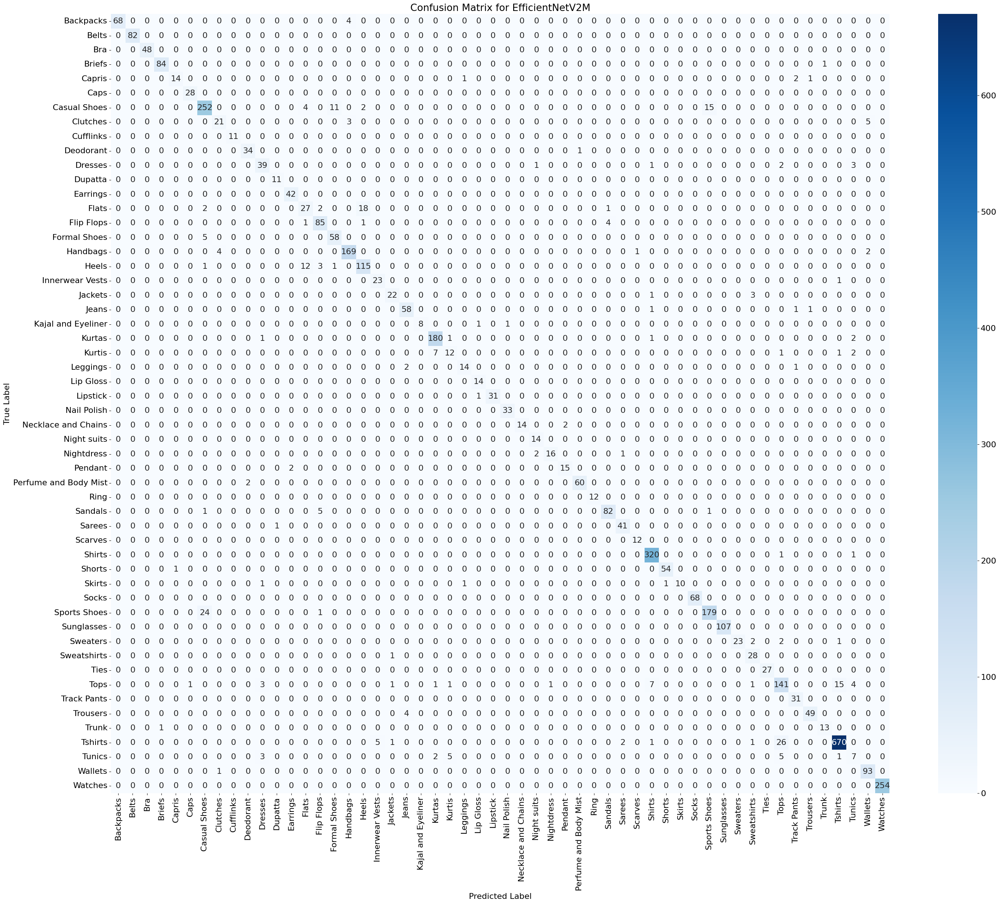

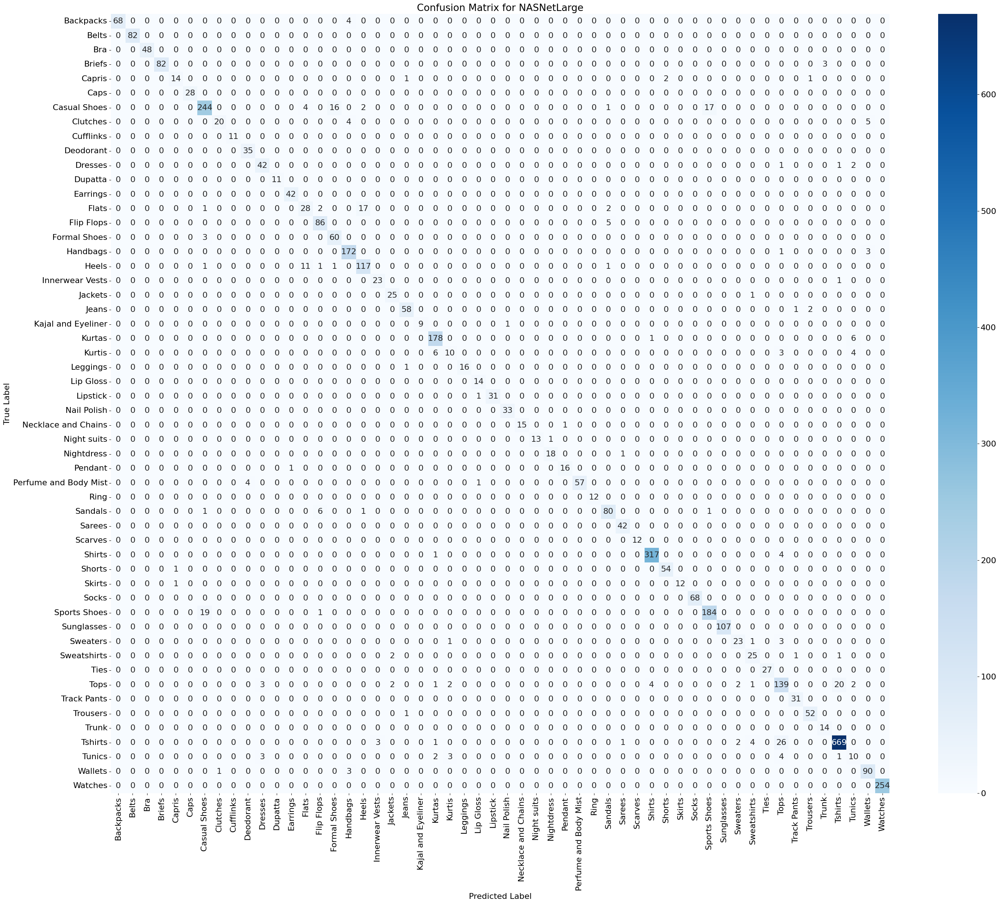

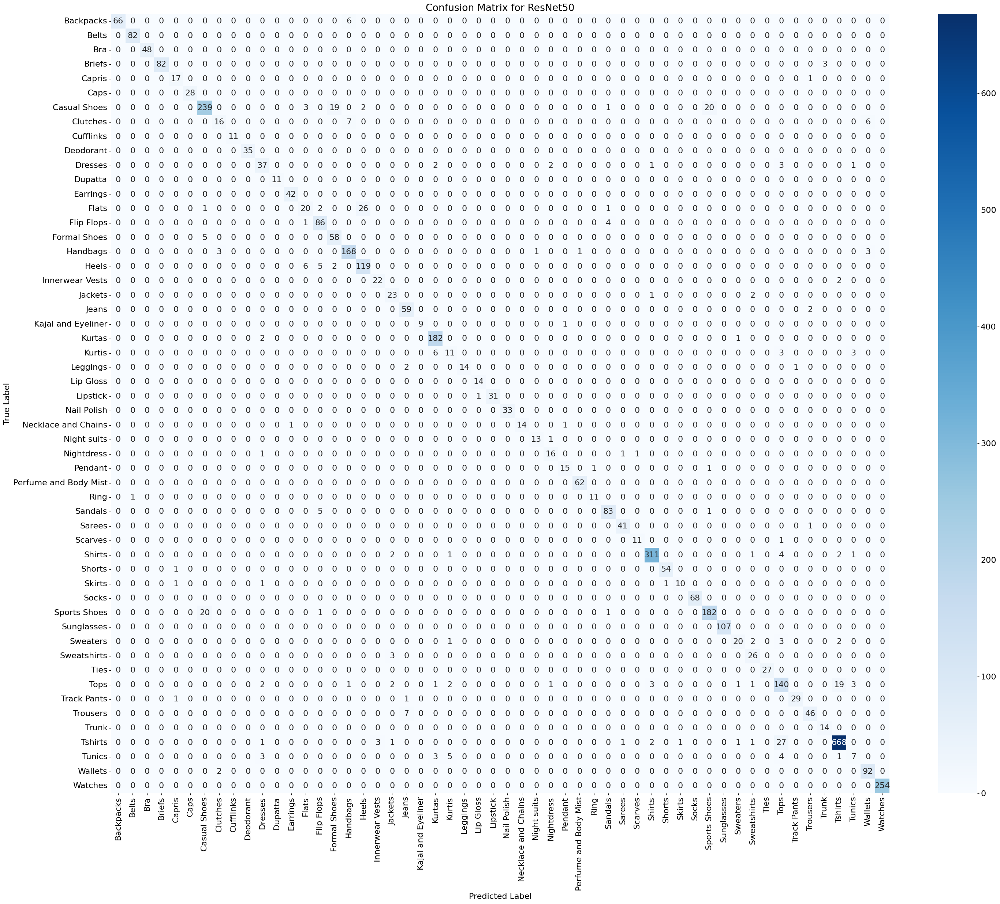

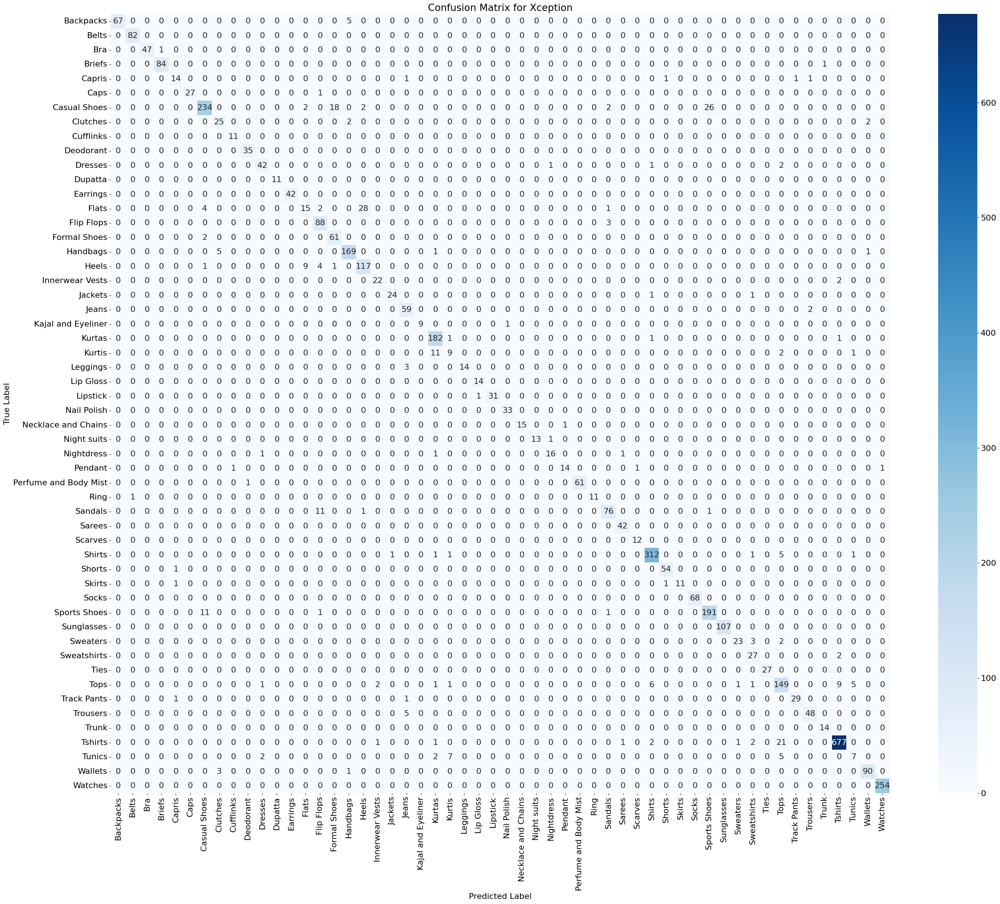

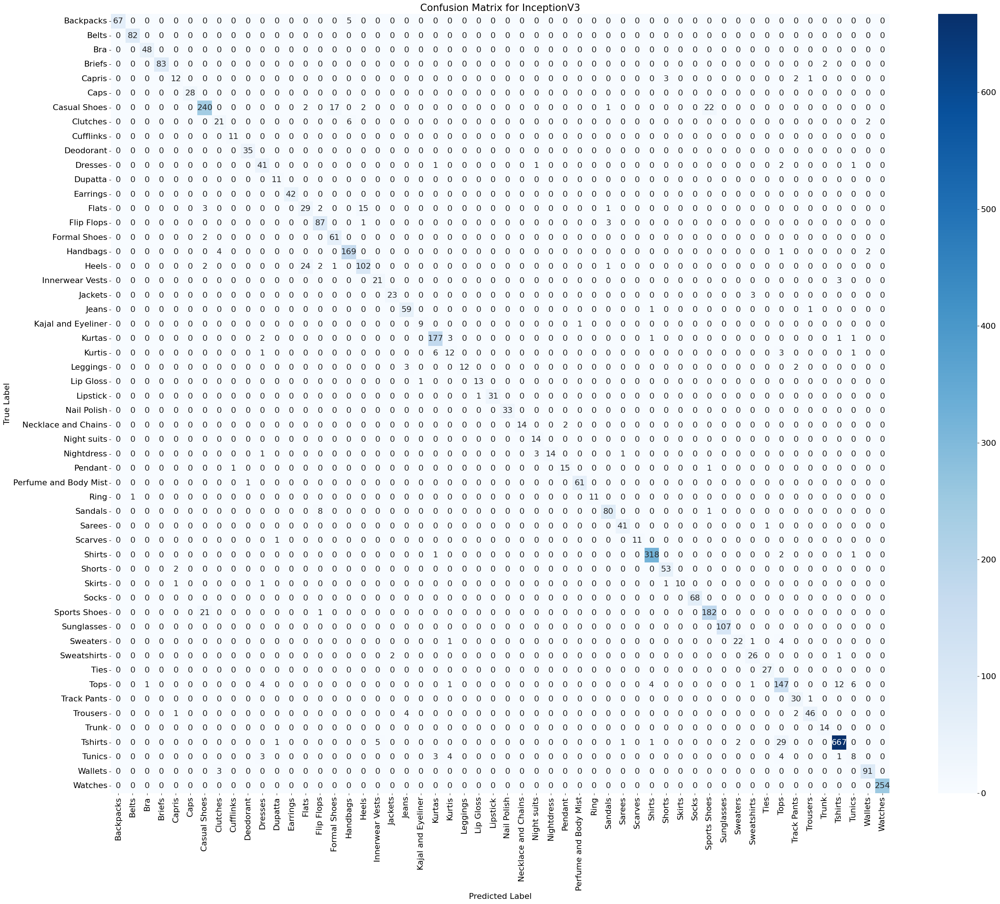

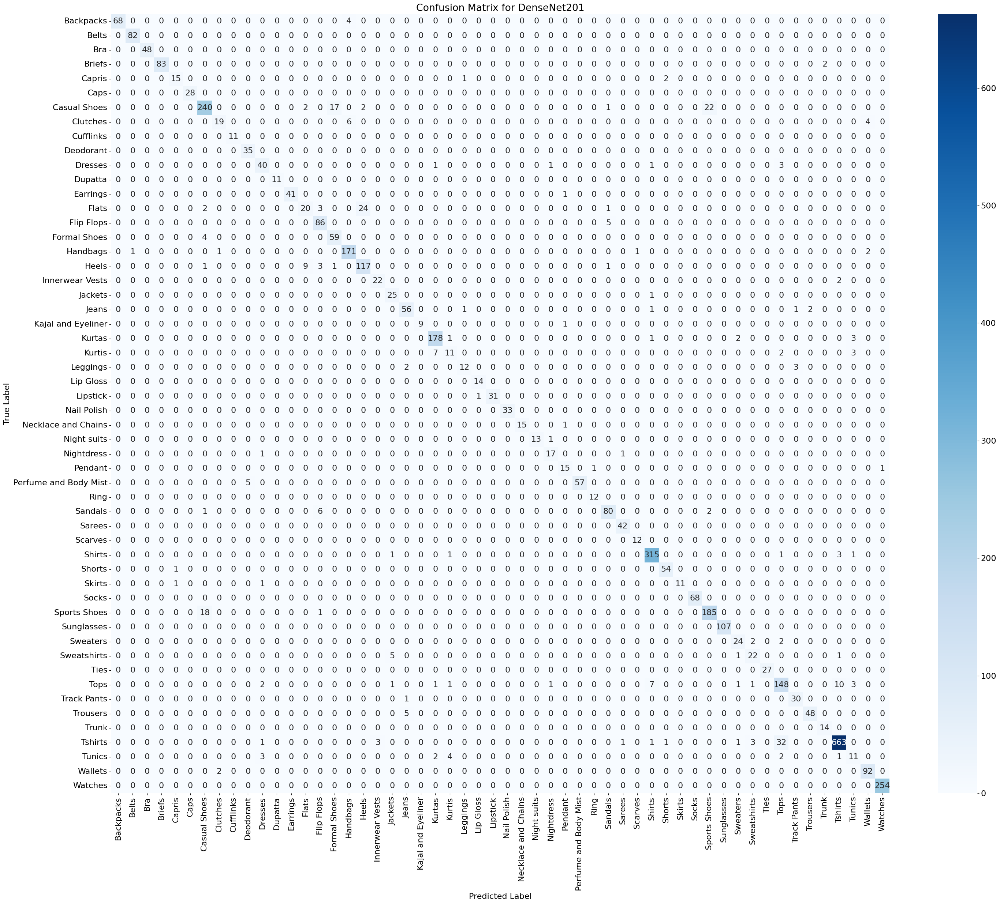

In [25]:
# Plot confusion matrix for each model
for model_name in models:
    cm = confusion_matrix(true_labels, predicted_labels[model_name])
    plt.figure(figsize=(30, 25))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
    plt.title(f'Confusion Matrix for {model_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig(f'confusion_matrix_{model_name}.png', dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

In [26]:
# Compare model performance
print("Model Performance Comparison:")
for model_name, result in test_results.items():
    print(f"{model_name}: Test Loss = {result['loss']:.4f}, Test Accuracy = {result['accuracy'] * 100:.2f}%")

Model Performance Comparison:
EfficientNetV2M: Test Loss = 0.2407, Test Accuracy = 93.07%
NASNetLarge: Test Loss = 0.2644, Test Accuracy = 93.19%
ResNet50: Test Loss = 0.2842, Test Accuracy = 92.15%
Xception: Test Loss = 0.2449, Test Accuracy = 92.91%
InceptionV3: Test Loss = 0.2429, Test Accuracy = 92.29%
DenseNet201: Test Loss = 0.2670, Test Accuracy = 92.55%


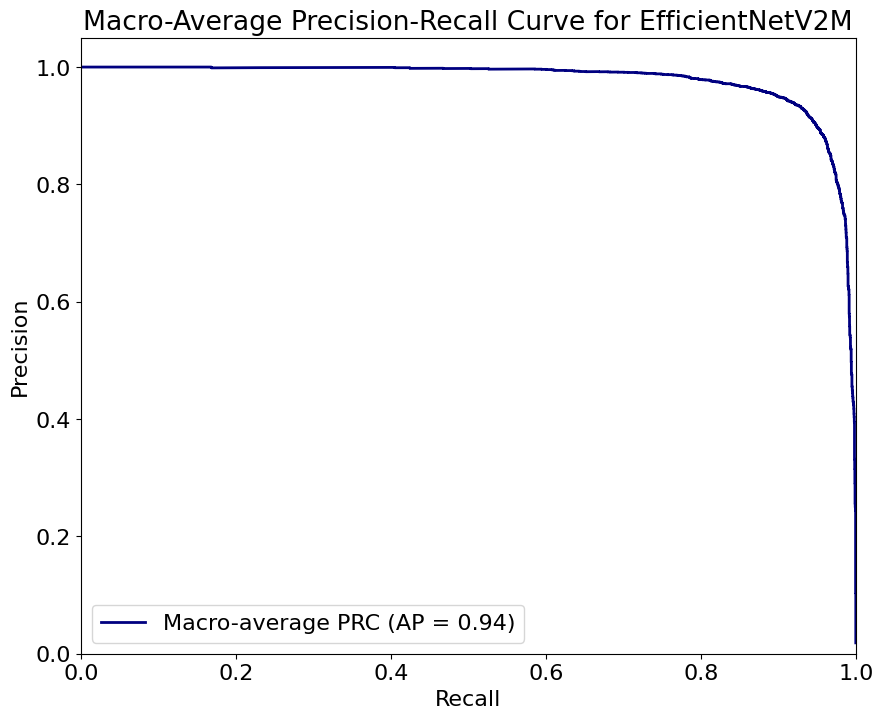

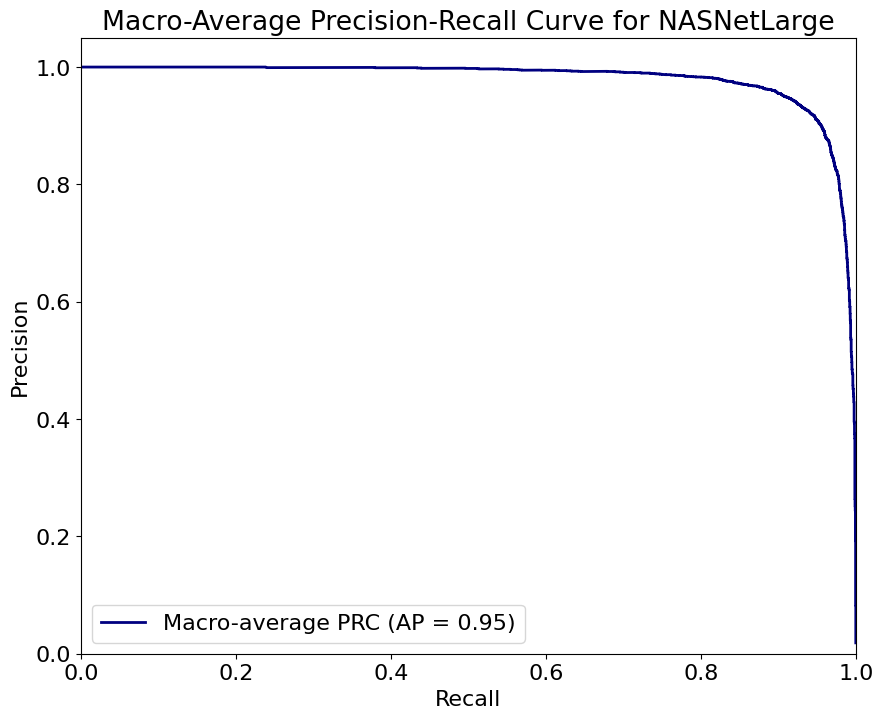

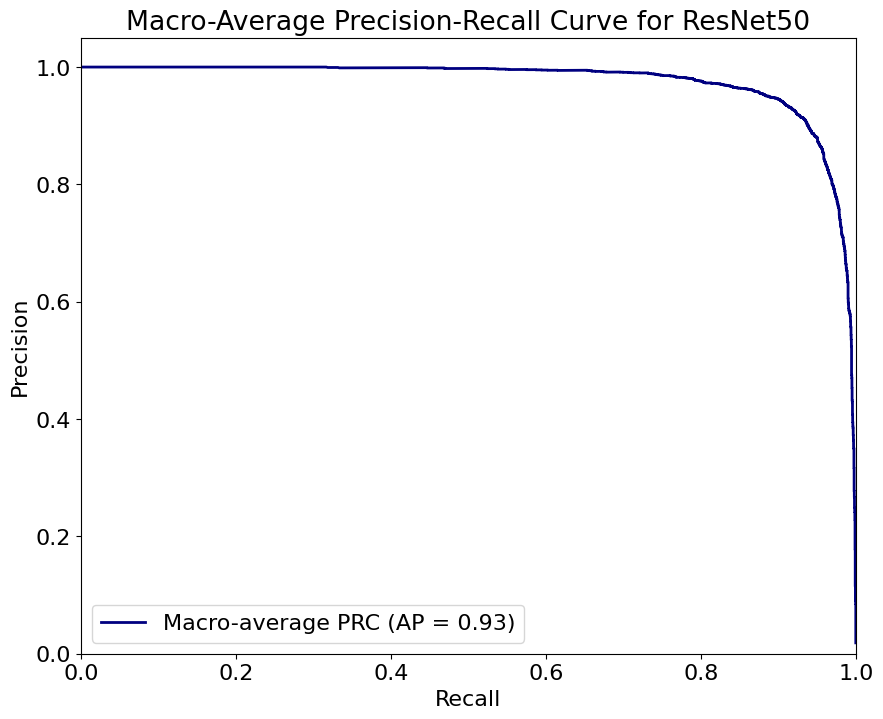

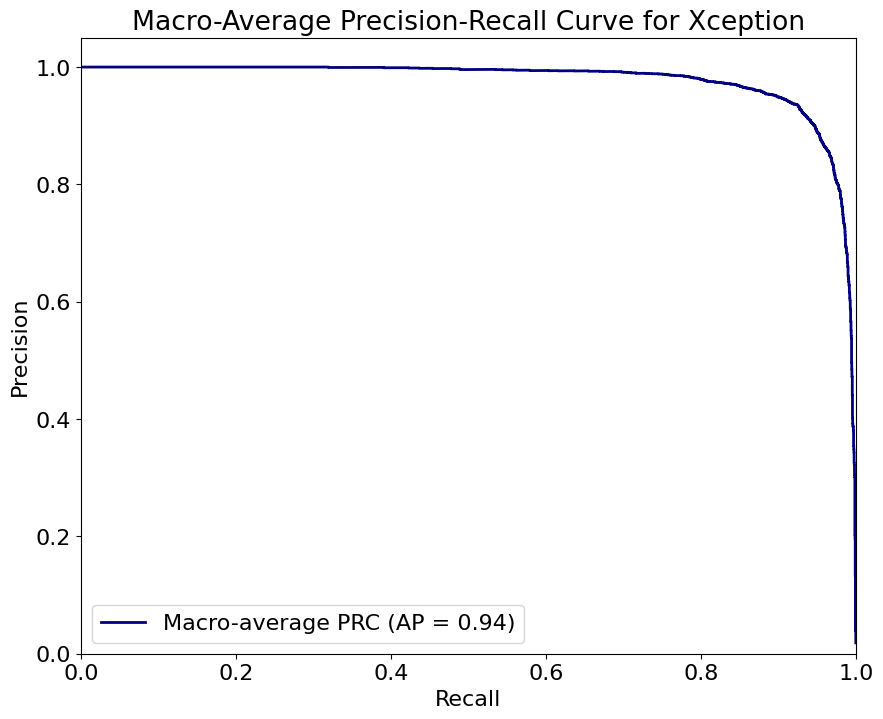

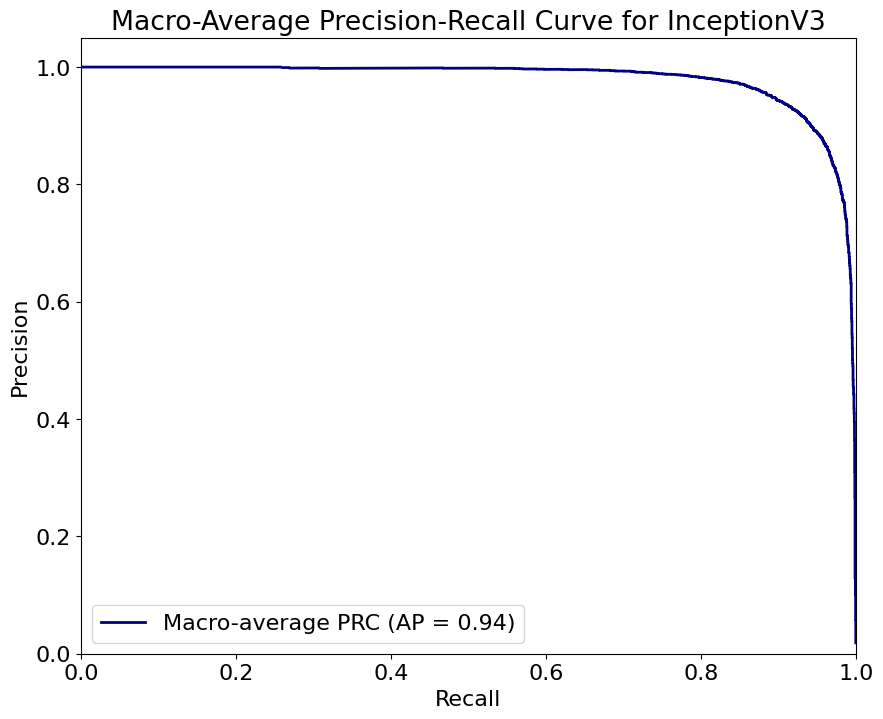

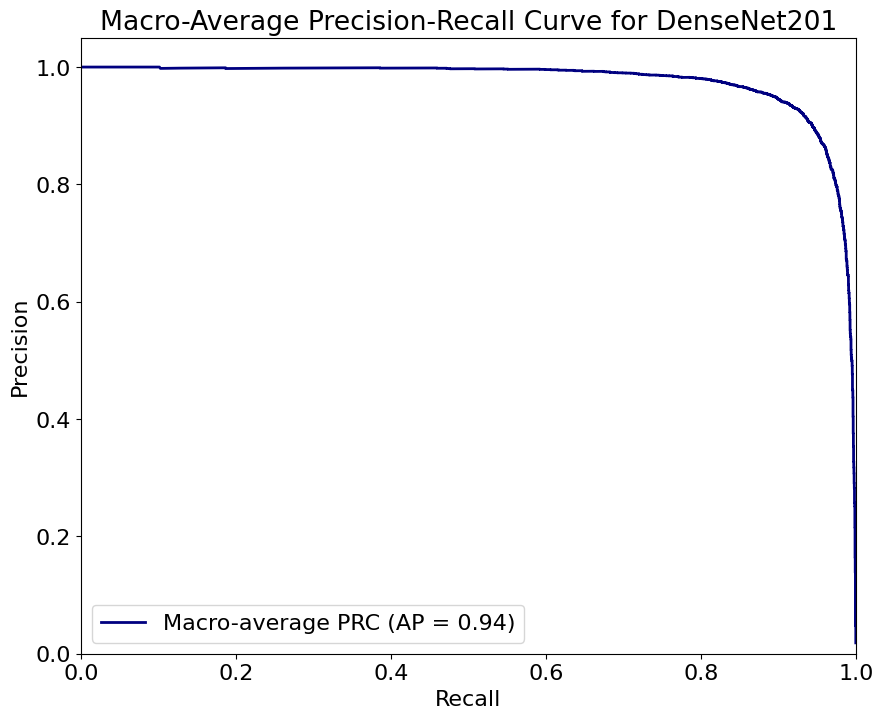


Macro-Average AUPRC Scores:
EfficientNetV2M: 0.9389
NASNetLarge: 0.9475
ResNet50: 0.9341
Xception: 0.9437
InceptionV3: 0.9441
DenseNet201: 0.9410


In [27]:
# Plot Precision-Recall curve and calculate AUPRC for each model
macro_auprcs = {}
for model_name in models:
    macro_auprcs[model_name] = plot_macro_average_prc_curve(true_labels, predicted_probabilities[model_name], class_labels, model_name)

# Print macro-average AUPRC scores for all models
print("\nMacro-Average AUPRC Scores:")
for model_name, auprc_score in macro_auprcs.items():
    print(f"{model_name}: {auprc_score:.4f}")

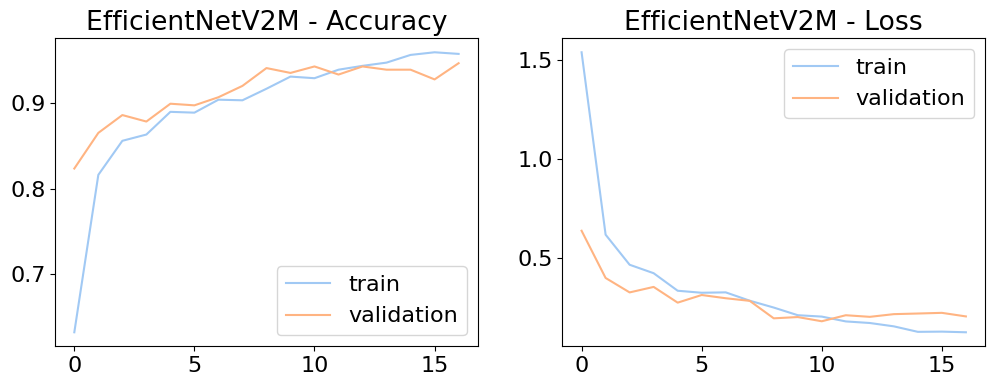

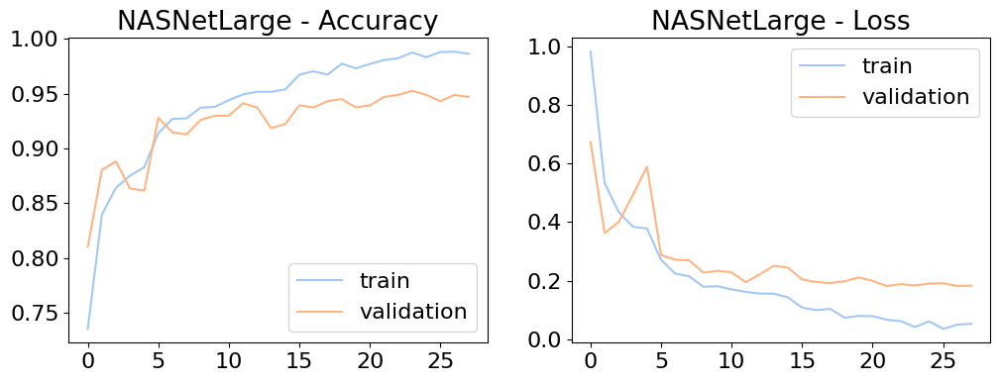

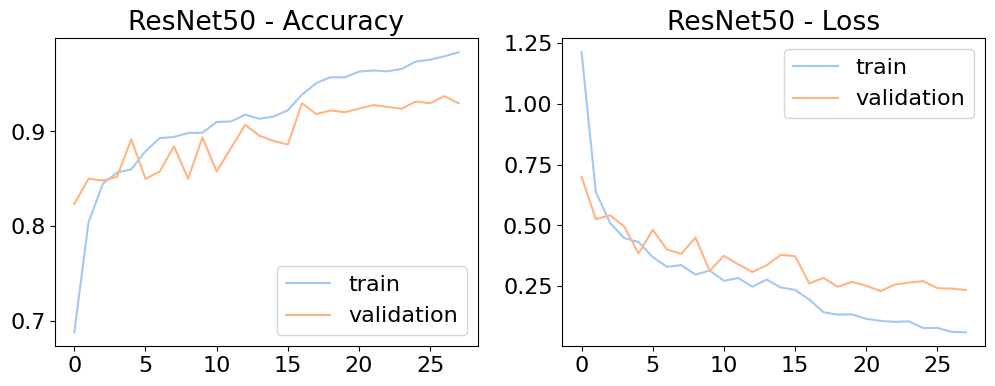

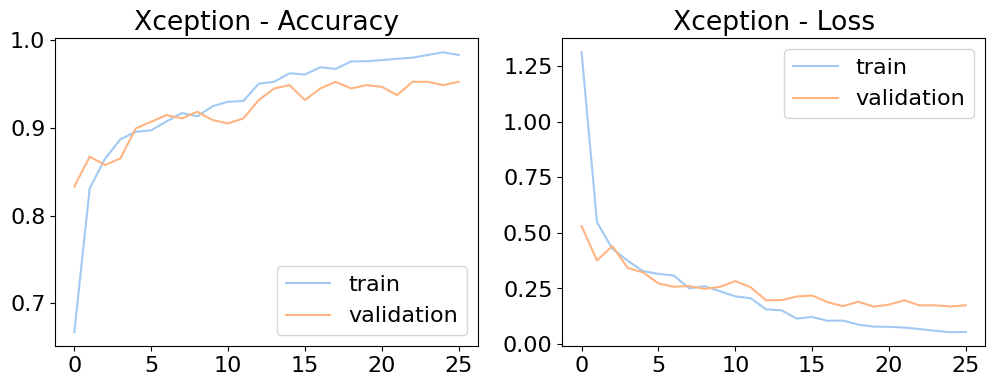

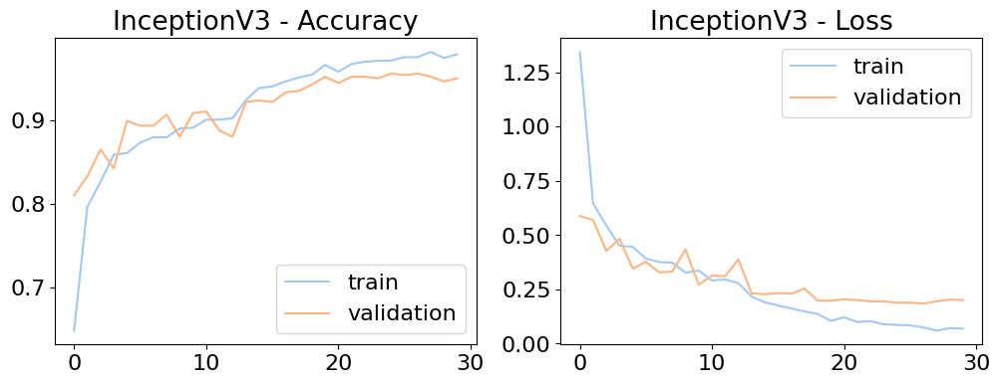

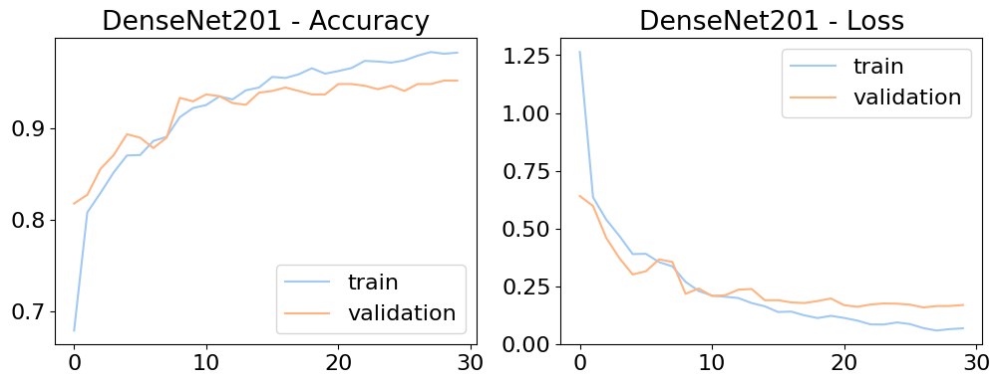

Evaluation completed for all models.
Class labels: ['Backpacks' 'Belts' 'Bra' 'Briefs' 'Capris' 'Caps' 'Casual Shoes'
 'Clutches' 'Cufflinks' 'Deodorant' 'Dresses' 'Dupatta' 'Earrings' 'Flats'
 'Flip Flops' 'Formal Shoes' 'Handbags' 'Heels' 'Innerwear Vests'
 'Jackets' 'Jeans' 'Kajal and Eyeliner' 'Kurtas' 'Kurtis' 'Leggings'
 'Lip Gloss' 'Lipstick' 'Nail Polish' 'Necklace and Chains' 'Night suits'
 'Nightdress' 'Pendant' 'Perfume and Body Mist' 'Ring' 'Sandals' 'Sarees'
 'Scarves' 'Shirts' 'Shorts' 'Skirts' 'Socks' 'Sports Shoes' 'Sunglasses'
 'Sweaters' 'Sweatshirts' 'Ties' 'Tops' 'Track Pants' 'Trousers' 'Trunk'
 'Tshirts' 'Tunics' 'Wallets' 'Watches']


In [28]:
# Plot training history for all models
for model_name, history in histories.items():
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='train')
    plt.plot(history.history['val_accuracy'], label='validation')
    plt.title(f'{model_name} - Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title(f'{model_name} - Loss')
    plt.legend()

    plt.savefig(f'training_history_{model_name}.png')
    plt.show()
    plt.close()

print("Evaluation completed for all models.")
print(f"Class labels: {class_labels}")

In [29]:
# Identify the best performing model
best_model = max(test_results, key=lambda x: test_results[x]['accuracy'])
print(f"\nBest performing model: {best_model}")
print(f"Best model accuracy: {test_results[best_model]['accuracy'] * 100:.2f}%")


Best performing model: NASNetLarge
Best model accuracy: 93.19%


In [30]:
# Additional analysis for the best model
best_model_predictions = predicted_labels[best_model]

# Top misclassified classes
misclassified = true_labels != best_model_predictions
misclassified_df = pd.DataFrame({
    'True': [class_labels[i] for i in true_labels[misclassified]],
    'Predicted': [class_labels[i] for i in best_model_predictions[misclassified]]
})
top_misclassified = misclassified_df.groupby(['True', 'Predicted']).size().sort_values(ascending=False).head(10)

print("\nTop 10 misclassified pairs:")
print(top_misclassified)


Top 10 misclassified pairs:
True          Predicted   
Tshirts       Tops            26
Tops          Tshirts         20
Sports Shoes  Casual Shoes    19
Flats         Heels           17
Casual Shoes  Sports Shoes    17
              Formal Shoes    16
Heels         Flats           11
Kurtas        Tunics           6
Sandals       Flip Flops       6
Kurtis        Kurtas           6
dtype: int64


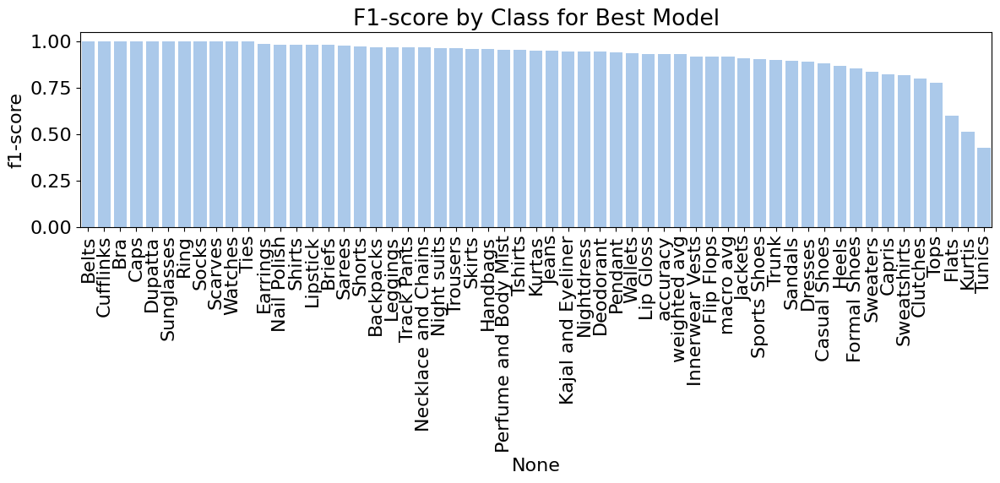


Analysis completed. All results and visualizations have been saved.


In [31]:
# Save top misclassified pairs
top_misclassified.to_csv('top_misclassified.csv')

# Class-wise accuracy
class_accuracy = classification_report(true_labels, best_model_predictions, target_names=class_labels, output_dict=True)
class_accuracy_df = pd.DataFrame(class_accuracy).transpose()
class_accuracy_df = class_accuracy_df.sort_values('f1-score', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=class_accuracy_df.index, y=class_accuracy_df['f1-score'])
plt.title('F1-score by Class for Best Model')
plt.xticks(rotation=90)
plt.tight_layout()
plt.savefig('f1_score_by_class.png')
plt.show()
plt.close()

print("\nAnalysis completed. All results and visualizations have been saved.")

Loaded history for EfficientNetV2M
Loaded history for NASNetLarge
Loaded history for ResNet50
Loaded history for Xception
Loaded history for InceptionV3
Loaded history for DenseNet201


/tmp/ipykernel_13/503519869.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=accuracies, y=model_names, palette="viridis")


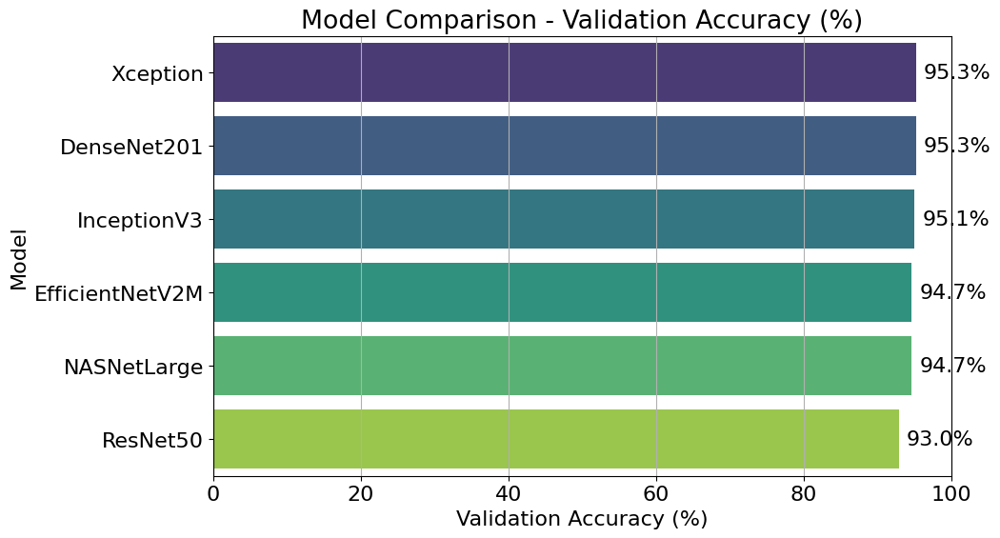

In [32]:
# Dictionary to store the training histories
histories = {}

# Load the training histories from saved pickle files
for model_name in models:
    file_path = f'history_{model_name}.pkl'  # Adjust path if saved elsewhere (e.g., '/kaggle/working/history_{model_name}.pkl')
    try:
        with open(file_path, 'rb') as f:
            histories[model_name] = pickle.load(f)
        print(f"Loaded history for {model_name}")
    except FileNotFoundError:
        print(f"Error: History file for {model_name} not found at {file_path}")
        continue

# Extract the final validation accuracy (converted to percentage)
val_accuracies = {model: histories[model]['val_accuracy'][-1] * 100 for model in histories}

# Sort models by validation accuracy
sorted_models = sorted(val_accuracies.items(), key=lambda x: x[1], reverse=True)

# Prepare data for plotting
model_names = [model for model, _ in sorted_models]
accuracies = [acc for _, acc in sorted_models]

# Create the horizontal bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=accuracies, y=model_names, palette="viridis")
plt.title('Model Comparison - Validation Accuracy (%)')
plt.xlabel('Validation Accuracy (%)')
plt.ylabel('Model')
plt.xlim(0, 100)  # Accuracy in percentage (0 to 100)
for i, v in enumerate(accuracies):
    plt.text(v + 1, i, f'{v:.1f}%', va='center')  # Add percentage labels
plt.grid(axis='x')

# Save the plot to a file
plt.savefig('/kaggle/working/model_comparison.png', dpi=300)  # Adjust path as needed
plt.show()
plt.close()